# 03 — Single Well Analytics — V2 Corrigido

Este notebook é a fase investigativa do projeto.

Ele lê a camada **enriched**, criada pelo notebook `02_single_well_feature_engineering.ipynb`, e começa a transformar curvas e atributos derivados em **insights físicos, geológicos e mecânicos**.

## Correções desta versão

Esta versão inclui uma proteção extra contra **colunas duplicadas**, que podem causar erro no Seaborn:

```text
ValueError: Data must be 1-dimensional
```

Esse erro normalmente acontece quando `df["RHOB"]`, por exemplo, retorna um DataFrame com duas colunas `RHOB`, em vez de uma Series 1D.

## Entrada

```text
data/enriched/parquet/single_well_features/
```

## Saída

```text
data/analytics/parquet/single_well_analytics/
```

## Objetivo

Criar um laboratório visual e interpretativo para entender:

- distribuição das propriedades;
- tendências com profundidade;
- zonas limpas e argilosas;
- regiões mais compactadas;
- regiões menos compactadas;
- transições;
- comportamento elástico;
- possíveis anomalias;
- intervalos homogêneos;
- clusters físicos simples;
- zonas candidatas para análise futura com FEniCS.

In [1]:
# ============================================================
# STEP 0 — ENVIRONMENT SETUP
# ============================================================

from __future__ import annotations

from pathlib import Path
from typing import List, Optional
import warnings

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


pd.set_option("display.max_columns", 250)
pd.set_option("display.max_rows", 250)
pd.set_option("display.width", 200)
pd.set_option("display.float_format", lambda x: f"{x:,.6f}")

sns.set_theme(style="whitegrid", context="notebook")
plt.rcParams["figure.figsize"] = (12, 6)
plt.rcParams["axes.titlesize"] = 14
plt.rcParams["axes.labelsize"] = 12

warnings.filterwarnings("ignore", category=UserWarning)


DATA_ENRICHED_DIR = Path("../data/enriched/parquet/single_well_features")
DATA_ANALYTICS_DIR = Path("../data/analytics/parquet/single_well_analytics")
REPORT_DIR = Path("../reports/single_well_analytics")

DATA_ANALYTICS_DIR.mkdir(parents=True, exist_ok=True)
REPORT_DIR.mkdir(parents=True, exist_ok=True)


# Se None, pega o parquet enriched mais recente.
# Para forçar um arquivo:
# ENRICHED_PARQUET_FILE = "AAM-4_single_well_features_enriched.parquet"
ENRICHED_PARQUET_FILE: Optional[str] = None


print("Ambiente preparado.")
print(f"DATA_ENRICHED_DIR = {DATA_ENRICHED_DIR.resolve()}")
print(f"DATA_ANALYTICS_DIR = {DATA_ANALYTICS_DIR.resolve()}")
print(f"REPORT_DIR = {REPORT_DIR.resolve()}")

Ambiente preparado.
DATA_ENRICHED_DIR = /home/wolf/Documentos/desenvolvimento/data-science-freestyle/wolf-petrophysics-analitics/data/enriched/parquet/single_well_features
DATA_ANALYTICS_DIR = /home/wolf/Documentos/desenvolvimento/data-science-freestyle/wolf-petrophysics-analitics/data/analytics/parquet/single_well_analytics
REPORT_DIR = /home/wolf/Documentos/desenvolvimento/data-science-freestyle/wolf-petrophysics-analitics/reports/single_well_analytics


# STEP 1 — Load Enriched Parquet

Primeiro carregamos o arquivo Parquet enriquecido.

Este arquivo já deve conter:
- curvas padronizadas;
- flags de QC;
- VP;
- VS;
- impedâncias;
- módulos elásticos;
- Vsh;
- atributos físicos derivados.

Nesta versão, logo após carregar o arquivo, também removemos colunas duplicadas mantendo a primeira ocorrência.

In [2]:
# ============================================================
# STEP 1 — LOAD ENRICHED PARQUET
# ============================================================

def list_enriched_parquet_files(data_dir: Path) -> List[Path]:
    if not data_dir.exists():
        raise FileNotFoundError(f"Pasta não encontrada: {data_dir.resolve()}")

    files = sorted(data_dir.glob("*.parquet"), key=lambda p: p.stat().st_mtime, reverse=True)

    if not files:
        raise FileNotFoundError(f"Nenhum parquet enriched encontrado em: {data_dir.resolve()}")

    return files


def make_unique_columns(df: pd.DataFrame) -> pd.DataFrame:
    """
    Remove colunas duplicadas mantendo a primeira ocorrência.

    Por que isso é importante?
    --------------------------
    Se o DataFrame tiver duas colunas com o mesmo nome, df["COLUNA"]
    pode retornar um DataFrame 2D em vez de uma Series 1D.

    Isso quebra funções como seaborn.scatterplot, gerando:
    ValueError: Data must be 1-dimensional.
    """
    duplicated = df.columns[df.columns.duplicated()].tolist()

    if duplicated:
        print("ATENÇÃO: colunas duplicadas encontradas e removidas mantendo a primeira ocorrência:")
        print(sorted(set(duplicated)))

    return df.loc[:, ~df.columns.duplicated()].copy()


enriched_files = list_enriched_parquet_files(DATA_ENRICHED_DIR)

display(pd.DataFrame({
    "FILE": [p.name for p in enriched_files],
    "MODIFIED_TIME": [pd.Timestamp(p.stat().st_mtime, unit="s") for p in enriched_files],
}))

if ENRICHED_PARQUET_FILE is None:
    selected_enriched_path = enriched_files[0]
else:
    selected_enriched_path = DATA_ENRICHED_DIR / ENRICHED_PARQUET_FILE
    if not selected_enriched_path.exists():
        raise FileNotFoundError(f"Arquivo não encontrado: {selected_enriched_path}")

df = pd.read_parquet(selected_enriched_path)

# Proteção global contra colunas duplicadas.
df = make_unique_columns(df)

if "WELL" in df.columns and df["WELL"].notna().any():
    WELL_NAME = str(df["WELL"].dropna().iloc[0])
else:
    WELL_NAME = selected_enriched_path.stem.replace("_single_well_features_enriched", "")

print(f"Arquivo enriched selecionado: {selected_enriched_path.name}")
print(f"Poço: {WELL_NAME}")
print(f"Shape: {df.shape}")

display(df.head())
display(df.tail())

print("Colunas duplicadas restantes:")
display(df.columns[df.columns.duplicated()])

,FILE,MODIFIED_TIME
0,TFT-4_single_well_features_enriched.parquet,2026-05-08 12:52:51.832861185


Arquivo enriched selecionado: TFT-4_single_well_features_enriched.parquet
Poço: TFT-4
Shape: (18731, 111)


,WELL,DEPTH,GR,RHOB,DTC,DTS,NPOR,RDEP,RMED,CALI,BS,DCALC,VP_MPS,VS_MPS,RHOB_KG_M3,AI,SI,VP_VS_RATIO,POISSON_RATIO,SHEAR_MODULUS_PA,BULK_MODULUS_PA,YOUNG_MODULUS_PA,VSH_GR_LINEAR,QC_FLAG_COUNT,QC_HAS_ANY_FLAG,FEATURE_QC_FLAG_COUNT,FEATURE_QC_HAS_ANY_FLAG,LITHOLOGY_CONFIDENCE,LITHOLOGY_CLASS,ROPA,ROP,PEF,DRHO,X_LOC,Y_LOC,Z_LOC,FLAG_GR_LOW,FLAG_GR_HIGH,FLAG_GR_ZERO,FLAG_GR_SUSPICIOUS,FLAG_RHOB_LOW,FLAG_RHOB_HIGH,FLAG_RHOB_ZERO,FLAG_RHOB_SUSPICIOUS,FLAG_DTC_LOW,FLAG_DTC_HIGH,FLAG_DTC_ZERO,FLAG_DTC_SUSPICIOUS,FLAG_DTS_LOW,FLAG_DTS_HIGH,FLAG_DTS_ZERO,FLAG_DTS_SUSPICIOUS,FLAG_NPOR_LOW,FLAG_NPOR_HIGH,FLAG_NPOR_ZERO,FLAG_NPOR_SUSPICIOUS,FLAG_RDEP_LOW,FLAG_RDEP_HIGH,FLAG_RDEP_ZERO,FLAG_RDEP_SUSPICIOUS,FLAG_RMED_LOW,FLAG_RMED_HIGH,FLAG_RMED_ZERO,FLAG_RMED_SUSPICIOUS,FLAG_CALI_LOW,FLAG_CALI_HIGH,FLAG_CALI_ZERO,FLAG_CALI_SUSPICIOUS,FLAG_BS_LOW,FLAG_BS_HIGH,FLAG_BS_ZERO,FLAG_BS_SUSPICIOUS,FLAG_GR_IQR_OUTLIER,FLAG_RHOB_IQR_OUTLIER,FLAG_DTC_IQR_OUTLIER,FLAG_DTS_IQR_OUTLIER,FLAG_NPOR_IQR_OUTLIER,FLAG_RDEP_IQR_OUTLIER,FLAG_RMED_IQR_OUTLIER,FLAG_CALI_IQR_OUTLIER,FLAG_BS_IQR_OUTLIER,ROBUST_Z_GR,FLAG_GR_ROBUST_Z_OUTLIER,ROBUST_Z_RHOB,FLAG_RHOB_ROBUST_Z_OUTLIER,ROBUST_Z_DTC,FLAG_DTC_ROBUST_Z_OUTLIER,ROBUST_Z_DTS,FLAG_DTS_ROBUST_Z_OUTLIER,ROBUST_Z_NPOR,FLAG_NPOR_ROBUST_Z_OUTLIER,ROBUST_Z_RDEP,FLAG_RDEP_ROBUST_Z_OUTLIER,ROBUST_Z_RMED,FLAG_RMED_ROBUST_Z_OUTLIER,ROBUST_Z_CALI,FLAG_CALI_ROBUST_Z_OUTLIER,ROBUST_Z_BS,FLAG_BS_ROBUST_Z_OUTLIER,FLAG_WASHOUT_DCALC_GT_1IN,FLAG_CLEAN_ROCK_GR_LOW,FLAG_SHALEY_GR_HIGH,FLAG_CLEAN_RESISTIVE_ZONE,FLAG_RHOB_SUSPICIOUS_WITH_WASHOUT,FLAG_HIGH_DTC_HIGH_DTS,FLAG_VP_MPS_SUSPICIOUS,FLAG_VS_MPS_SUSPICIOUS,FLAG_RHOB_KG_M3_SUSPICIOUS,FLAG_POISSON_SUSPICIOUS,FLAG_VP_VS_SUSPICIOUS,FLAG_ELASTIC_MODULUS_NEGATIVE
0,TFT-4,372.008400,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,False,0,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,NaN,False,NaN,False,NaN,False,NaN,False,NaN,False,NaN,False,NaN,False,NaN,False,NaN,False,False,False,False,False,False,False,False,False,False,False,False,False
1,TFT-4,372.160400,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,False,0,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,NaN,False,NaN,False,NaN,False,NaN,False,NaN,False,NaN,False,NaN,False,NaN,False,NaN,False,False,False,False,False,False,False,False,False,False,False,False,False
2,TFT-4,372.312400,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,False,0,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,NaN,False,NaN,False,NaN,False,NaN,False,NaN,False,NaN,False,NaN,False,NaN,False,NaN,False,False,False,False,False,False,False,False,False,False,False,False,False
3,TFT-4,372.464400,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,False,0,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,NaN,False,NaN,False,NaN,False,NaN,False,NaN,False,NaN,False,NaN,False,NaN,Fa

,WELL,DEPTH,GR,RHOB,DTC,DTS,NPOR,RDEP,RMED,CALI,BS,DCALC,VP_MPS,VS_MPS,RHOB_KG_M3,AI,SI,VP_VS_RATIO,POISSON_RATIO,SHEAR_MODULUS_PA,BULK_MODULUS_PA,YOUNG_MODULUS_PA,VSH_GR_LINEAR,QC_FLAG_COUNT,QC_HAS_ANY_FLAG,FEATURE_QC_FLAG_COUNT,FEATURE_QC_HAS_ANY_FLAG,LITHOLOGY_CONFIDENCE,LITHOLOGY_CLASS,ROPA,ROP,PEF,DRHO,X_LOC,Y_LOC,Z_LOC,FLAG_GR_LOW,FLAG_GR_HIGH,FLAG_GR_ZERO,FLAG_GR_SUSPICIOUS,FLAG_RHOB_LOW,FLAG_RHOB_HIGH,FLAG_RHOB_ZERO,FLAG_RHOB_SUSPICIOUS,FLAG_DTC_LOW,FLAG_DTC_HIGH,FLAG_DTC_ZERO,FLAG_DTC_SUSPICIOUS,FLAG_DTS_LOW,FLAG_DTS_HIGH,FLAG_DTS_ZERO,FLAG_DTS_SUSPICIOUS,FLAG_NPOR_LOW,FLAG_NPOR_HIGH,FLAG_NPOR_ZERO,FLAG_NPOR_SUSPICIOUS,FLAG_RDEP_LOW,FLAG_RDEP_HIGH,FLAG_RDEP_ZERO,FLAG_RDEP_SUSPICIOUS,FLAG_RMED_LOW,FLAG_RMED_HIGH,FLAG_RMED_ZERO,FLAG_RMED_SUSPICIOUS,FLAG_CALI_LOW,FLAG_CALI_HIGH,FLAG_CALI_ZERO,FLAG_CALI_SUSPICIOUS,FLAG_BS_LOW,FLAG_BS_HIGH,FLAG_BS_ZERO,FLAG_BS_SUSPICIOUS,FLAG_GR_IQR_OUTLIER,FLAG_RHOB_IQR_OUTLIER,FLAG_DTC_IQR_OUTLIER,FLAG_DTS_IQR_OUTLIER,FLAG_NPOR_IQR_OUTLIER,FLAG_RDEP_IQR_OUTLIER,FLAG_RMED_IQR_OUTLIER,FLAG_CALI_IQR_OUTLIER,FLAG_BS_IQR_OUTLIER,ROBUST_Z_GR,FLAG_GR_ROBUST_Z_OUTLIER,ROBUST_Z_RHOB,FLAG_RHOB_ROBUST_Z_OUTLIER,ROBUST_Z_DTC,FLAG_DTC_ROBUST_Z_OUTLIER,ROBUST_Z_DTS,FLAG_DTS_ROBUST_Z_OUTLIER,ROBUST_Z_NPOR,FLAG_NPOR_ROBUST_Z_OUTLIER,ROBUST_Z_RDEP,FLAG_RDEP_ROBUST_Z_OUTLIER,ROBUST_Z_RMED,FLAG_RMED_ROBUST_Z_OUTLIER,ROBUST_Z_CALI,FLAG_CALI_ROBUST_Z_OUTLIER,ROBUST_Z_BS,FLAG_BS_ROBUST_Z_OUTLIER,FLAG_WASHOUT_DCALC_GT_1IN,FLAG_CLEAN_ROCK_GR_LOW,FLAG_SHALEY_GR_HIGH,FLAG_CLEAN_RESISTIVE_ZONE,FLAG_RHOB_SUSPICIOUS_WITH_WASHOUT,FLAG_HIGH_DTC_HIGH_DTS,FLAG_VP_MPS_SUSPICIOUS,FLAG_VS_MPS_SUSPICIOUS,FLAG_RHOB_KG_M3_SUSPICIOUS,FLAG_POISSON_SUSPICIOUS,FLAG_VP_VS_SUSPICIOUS,FLAG_ELASTIC_MODULUS_NEGATIVE
18726,TFT-4,"3,218.360400",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,False,0,False,NaN,NaN,32.203064,NaN,NaN,NaN,NaN,NaN,NaN,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,NaN,False,NaN,False,NaN,False,NaN,False,NaN,False,NaN,False,NaN,False,NaN,False,NaN,False,False,False,False,False,False,False,False,False,False,False,False,False
18727,TFT-4,"3,218.512400",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,False,0,False,NaN,NaN,28.998888,NaN,NaN,NaN,NaN,NaN,NaN,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,NaN,False,NaN,False,NaN,False,NaN,False,NaN,False,NaN,False,NaN,False,NaN,False,NaN,False,False,False,False,False,False,False,False,False,False,False,False,False
18728,TFT-4,"3,218.664400",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,False,0,False,NaN,NaN,25.799675,NaN,NaN,NaN,NaN,NaN,NaN,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,NaN,False,NaN,False,NaN,False,NaN,False,NaN,False,NaN,False,NaN,False,NaN,False,NaN,False,False,False,False,False,False,False,False,False,False,False,False,False
18729,TFT-4,"3,218.816400",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,False,0,False,NaN,NaN,22.596163,NaN,NaN,NaN,NaN,NaN,NaN,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,NaN,False,NaN,False,

Colunas duplicadas restantes:


Index([], dtype='str')

# STEP 2 — Data Availability and Analytics Readiness

Antes de analisar, precisamos saber quais propriedades estão disponíveis.

Isto evita uma armadilha comum: tentar interpretar uma propriedade que tem pouquíssimos dados válidos.

,COLUMN,EXISTS,NON_NULL_COUNT,FILL_RATE
0,DEPTH,True,18731,1.000000
1,GR,True,18666,0.996530
2,VSH_GR_LINEAR,True,18666,0.996530
3,RHOB,True,7800,0.416422
4,RHOB_KG_M3,True,7800,0.416422
5,DTC,True,18199,0.971598
6,DTS,True,15252,0.814265
7,VP_MPS,True,18199,0.971598
8,VS_MPS,True,15252,0.814265
9,AI,True,7642,0.407987


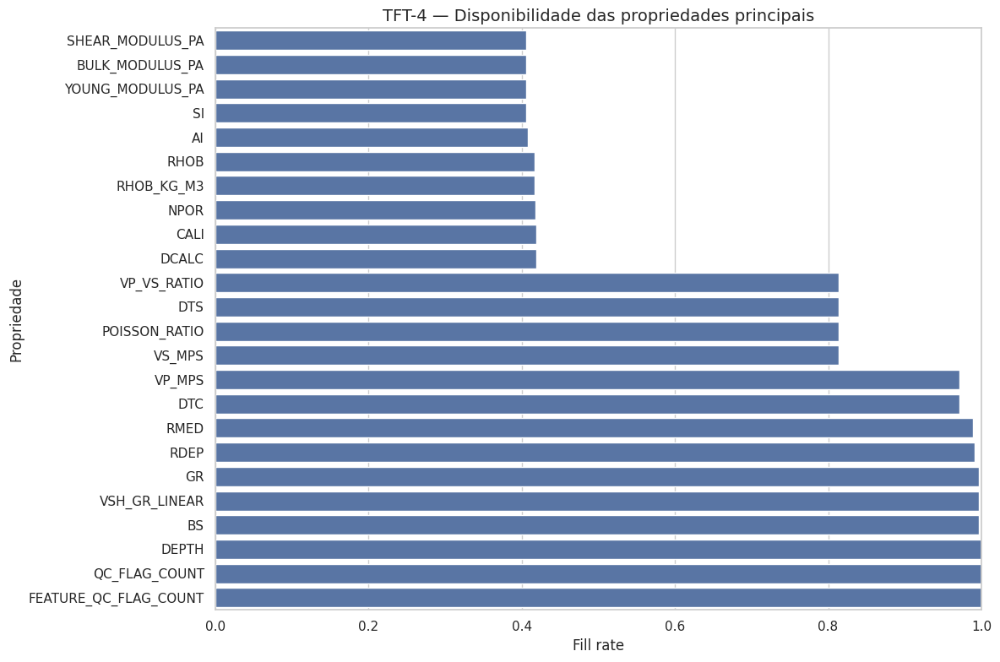

In [3]:
# ============================================================
# STEP 2 — DATA AVAILABILITY AND ANALYTICS READINESS
# ============================================================

important_cols = [
    "DEPTH", "GR", "VSH_GR_LINEAR", "RHOB", "RHOB_KG_M3",
    "DTC", "DTS", "VP_MPS", "VS_MPS",
    "AI", "SI", "VP_VS_RATIO", "POISSON_RATIO",
    "SHEAR_MODULUS_PA", "BULK_MODULUS_PA", "YOUNG_MODULUS_PA",
    "RDEP", "RMED", "RSHA", "NPOR", "CALI", "BS", "DCALC",
    "QC_FLAG_COUNT", "FEATURE_QC_FLAG_COUNT"
]

availability_rows = []

for col in important_cols:
    exists = col in df.columns
    non_null = int(df[col].notna().sum()) if exists else 0
    fill_rate = float(df[col].notna().mean()) if exists else 0.0

    availability_rows.append({
        "COLUMN": col,
        "EXISTS": exists,
        "NON_NULL_COUNT": non_null,
        "FILL_RATE": fill_rate,
    })

availability_df = pd.DataFrame(availability_rows)
display(availability_df)

availability_df.to_csv(REPORT_DIR / f"{WELL_NAME}_analytics_availability.csv", index=False)

plt.figure(figsize=(12, 8))
plot_df = availability_df[availability_df["EXISTS"]].sort_values("FILL_RATE", ascending=True)
sns.barplot(data=plot_df, y="COLUMN", x="FILL_RATE", orient="h")
plt.title(f"{WELL_NAME} — Disponibilidade das propriedades principais")
plt.xlabel("Fill rate")
plt.ylabel("Propriedade")
plt.xlim(0, 1)
plt.tight_layout()
plt.show()

## Interpretação mental — disponibilidade dos dados

Este gráfico responde uma pergunta simples, mas muito importante:

> **Quais propriedades realmente existem em quantidade suficiente para análise?**

Como interpretar:

- barras próximas de 1.0 indicam propriedades muito completas;
- barras intermediárias indicam propriedades úteis, mas com cuidado;
- barras muito baixas indicam que a propriedade talvez não sustente conclusões fortes;
- se `DTS`, `VS_MPS`, `SI` e módulos elásticos estiverem com baixo preenchimento, a análise elástica fica mais limitada;
- se `GR`, `RHOB` e `DTC` estiverem fortes, ainda há bastante coisa petrofísica para investigar.

Conclusão prática:

Antes de qualquer insight, precisamos saber se o dado suporta a pergunta.

# STEP 3 — Global Descriptive Statistics

Agora entramos em estatística descritiva.

Vamos calcular média, mediana, desvio padrão, percentis, amplitude, IQR, coeficiente de variação, assimetria e curtose.

In [4]:
# ============================================================
# STEP 3 — GLOBAL DESCRIPTIVE STATISTICS
# ============================================================

analysis_cols = [
    "GR", "VSH_GR_LINEAR", "RHOB", "DTC", "DTS",
    "VP_MPS", "VS_MPS", "AI", "SI", "VP_VS_RATIO",
    "POISSON_RATIO", "SHEAR_MODULUS_PA", "BULK_MODULUS_PA",
    "YOUNG_MODULUS_PA", "RDEP", "NPOR", "DCALC"
]

analysis_cols = [c for c in analysis_cols if c in df.columns and df[c].notna().any()]

desc = df[analysis_cols].describe(
    percentiles=[0.01, 0.05, 0.10, 0.25, 0.50, 0.75, 0.90, 0.95, 0.99]
).T

desc["range"] = desc["max"] - desc["min"]
desc["iqr"] = desc["75%"] - desc["25%"]
desc["cv"] = desc["std"] / desc["mean"].replace(0, np.nan)
desc["skew"] = df[analysis_cols].skew(numeric_only=True)
desc["kurtosis"] = df[analysis_cols].kurtosis(numeric_only=True)

display(desc)
desc.to_csv(REPORT_DIR / f"{WELL_NAME}_global_descriptive_statistics.csv")

,count,mean,std,min,1%,5%,10%,25%,50%,75%,90%,95%,99%,max,range,iqr,cv,skew,kurtosis
GR,"18,666.000000",88.059741,28.029797,9.397405,21.340940,45.700624,55.094030,72.368660,89.986179,100.472012,112.043545,125.441013,189.591998,243.851028,234.453624,28.103352,0.318304,0.895220,3.661915
VSH_GR_LINEAR,"18,666.000000",0.514177,0.261052,0.000000,0.000000,0.000001,0.117800,0.334436,0.555372,0.686871,0.831986,0.999974,1.000000,1.000000,1.000000,0.352436,0.507709,-0.238357,-0.562151
RHOB,"7,800.000000",2.423469,0.140661,1.259571,2.131731,2.211361,2.260234,2.356557,2.432674,2.518349,2.567522,2.594697,2.659134,3.209886,1.950315,0.161791,0.058041,-2.277243,14.566817
DTC,"18,199.000000",113.930604,33.930530,51.216694,58.560824,68.977313,75.339792,83.164452,103.830116,148.459099,157.337512,160.121806,173.772296,183.871933,132.655239,65.294647,0.297818,0.128880,-1.547058
DTS,"15,252.000000",265.417520,112.633809,86.628220,116.473900,133.747711,140.743065,154.378006,245.879082,378.433235,407.472522,417.216252,428.729909,448.593384,361.965164,224.055229,0.424365,0.087724,-1.779693
VP_MPS,"18,199.000000","2,937.276746",903.956624,"1,657.675508","1,754.019530","1,903.550847","1,937.236682","2,053.090733","2,935.564468","3,665.027475","4,045.670856","4,418.844194","5,204.844835","5,951.184603","4,293.509094","1,611.936742",0.307753,0.422403,-0.872390
VS_MPS,"15,252.000000","1,401.489514",611.703560,679.457190,710.937104,730.556392,748.025900,805.426088,"1,239.633865","1,974.374513","2,165.648448","2,278.917507","2,616.895392","3,518.483947","2,839.026757","1,168.948425",0.436467,0.271799,-1.433565
AI,"7,642.000000","8,733,801.324905","1,556,381.531669","2,926,859.008373","5,275,753.842900","5,663,957.122957","6,701,059.404386","7,975,190.295510","8,784,306.556835","9,635,205.994697","10,483,598.445535","11,051,305.640737","13,015,204.970037","15,928,885.248677","13,002,026.240304","1,660,015.699187",0.178202,-0.041253,1.373235
SI,"7,602.000000","4,820,689.041726","845,084.750142","1,742,690.391854","2,900,267.824772","3,399,278.691631","3,878,868.886037","4,326,002.453885","4,788,368.852272","5,322,273.591022","5,799,944.079117","6,058,803.215207","7,395,843.496892","9,447,535.209436","7,704,844.817582","996,271.137137",0.175304,0.449592,2.169708
VP_VS_RATIO,"15,252.000000",2.166400,0.386320,1.225783,1.561446,1.708494,1.747120,1.809557,2.102940,2.535416,2.653968,2.705129,2.810770,5.084796,3.859013,0.725859,0.178324,0.499558,0.890334


## Interpretação mental — estatística descritiva global

Esta tabela é como o exame de sangue geral do poço.

- média mostra tendência central, mas pode ser enganada por outliers;
- mediana é mais robusta;
- IQR mostra a dispersão do miolo dos dados;
- skew mostra cauda assimétrica;
- kurtosis mostra caudas pesadas/extremos.

Conclusão prática:

Esta tabela não entrega a interpretação final, mas mostra quais propriedades merecem gráficos mais cuidadosos.

# STEP 4 — Distribution Analysis

Agora estudamos as distribuições usando:

- histograma;
- KDE;
- boxplot;
- violin plot;
- ECDF;
- zoom P01–P99.

In [5]:
# ============================================================
# STEP 4 — DISTRIBUTION ANALYSIS FUNCTIONS
# ============================================================

def plot_distribution_suite(df: pd.DataFrame, col: str, bins: int = 80) -> None:
    safe_df = make_unique_columns(df)

    if col not in safe_df.columns or safe_df[col].dropna().empty:
        print(f"Coluna indisponível: {col}")
        return

    x = pd.to_numeric(safe_df[col], errors="coerce").dropna()

    fig = plt.figure(figsize=(16, 12))
    gs = fig.add_gridspec(3, 2)

    ax1 = fig.add_subplot(gs[0, 0])
    sns.histplot(x, bins=bins, kde=True, ax=ax1)
    ax1.set_title(f"{col} — Histograma + KDE")
    ax1.set_xlabel(col)

    ax2 = fig.add_subplot(gs[0, 1])
    sns.boxplot(x=x, ax=ax2)
    ax2.set_title(f"{col} — Boxplot")
    ax2.set_xlabel(col)

    ax3 = fig.add_subplot(gs[1, 0])
    sns.violinplot(x=x, ax=ax3, inner="quartile")
    ax3.set_title(f"{col} — Violin plot")
    ax3.set_xlabel(col)

    ax4 = fig.add_subplot(gs[1, 1])
    sns.ecdfplot(x=x, ax=ax4)
    ax4.set_title(f"{col} — ECDF")
    ax4.set_xlabel(col)
    ax4.set_ylabel("Proporção acumulada")

    ax5 = fig.add_subplot(gs[2, :])
    q_low = x.quantile(0.01)
    q_high = x.quantile(0.99)
    x_zoom = x[(x >= q_low) & (x <= q_high)]
    sns.histplot(x_zoom, bins=bins, kde=True, ax=ax5)
    ax5.set_title(f"{col} — Zoom P01 a P99")
    ax5.set_xlabel(col)

    plt.tight_layout()
    plt.show()


distribution_cols = [
    "GR", "VSH_GR_LINEAR", "RHOB", "DTC", "DTS",
    "VP_MPS", "VS_MPS", "AI", "SI", "VP_VS_RATIO",
    "POISSON_RATIO", "SHEAR_MODULUS_PA", "BULK_MODULUS_PA",
    "YOUNG_MODULUS_PA", "RDEP", "NPOR"
]

distribution_cols = [c for c in distribution_cols if c in df.columns and df[c].notna().any()]
print("Colunas disponíveis para análise de distribuição:")
print(distribution_cols)

Colunas disponíveis para análise de distribuição:
['GR', 'VSH_GR_LINEAR', 'RHOB', 'DTC', 'DTS', 'VP_MPS', 'VS_MPS', 'AI', 'SI', 'VP_VS_RATIO', 'POISSON_RATIO', 'SHEAR_MODULUS_PA', 'BULK_MODULUS_PA', 'YOUNG_MODULUS_PA', 'RDEP', 'NPOR']


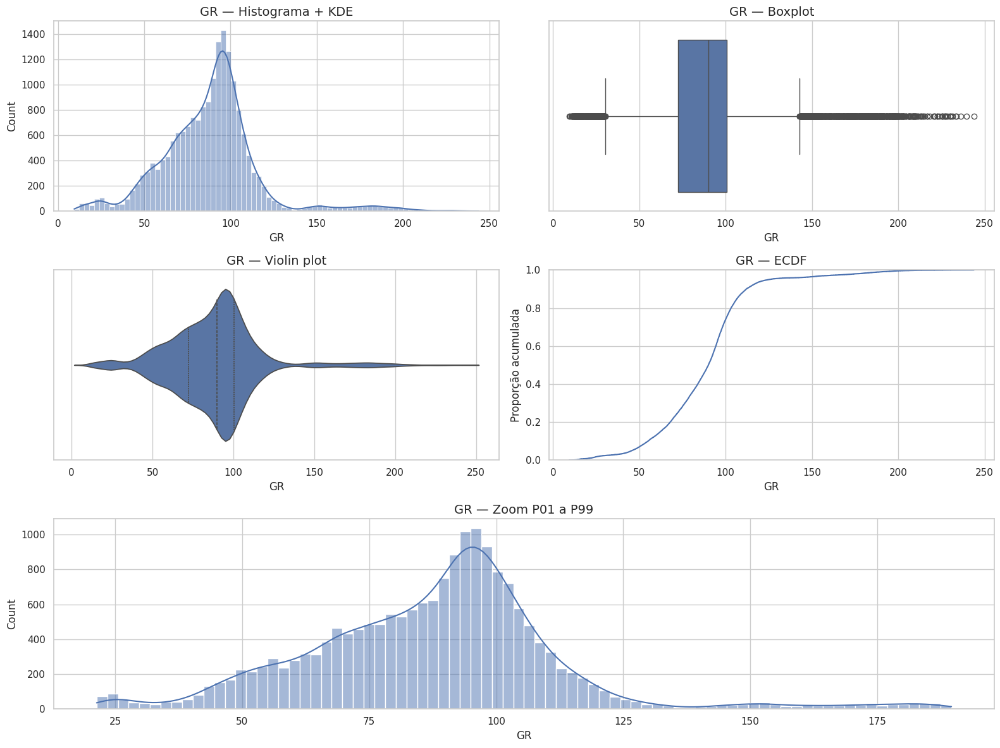

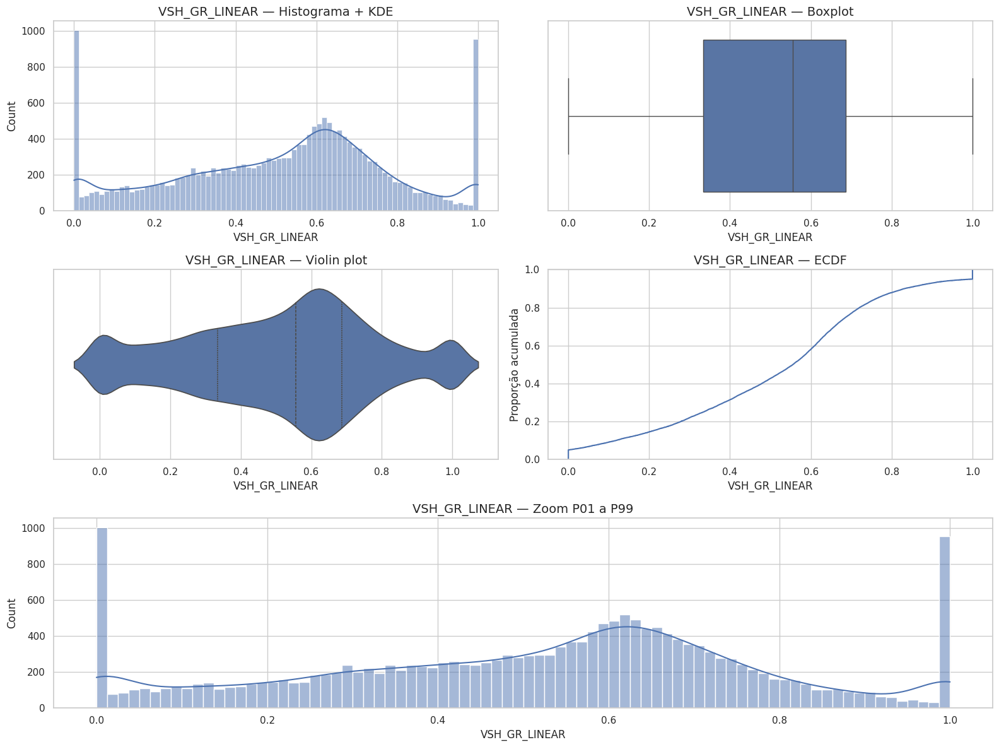

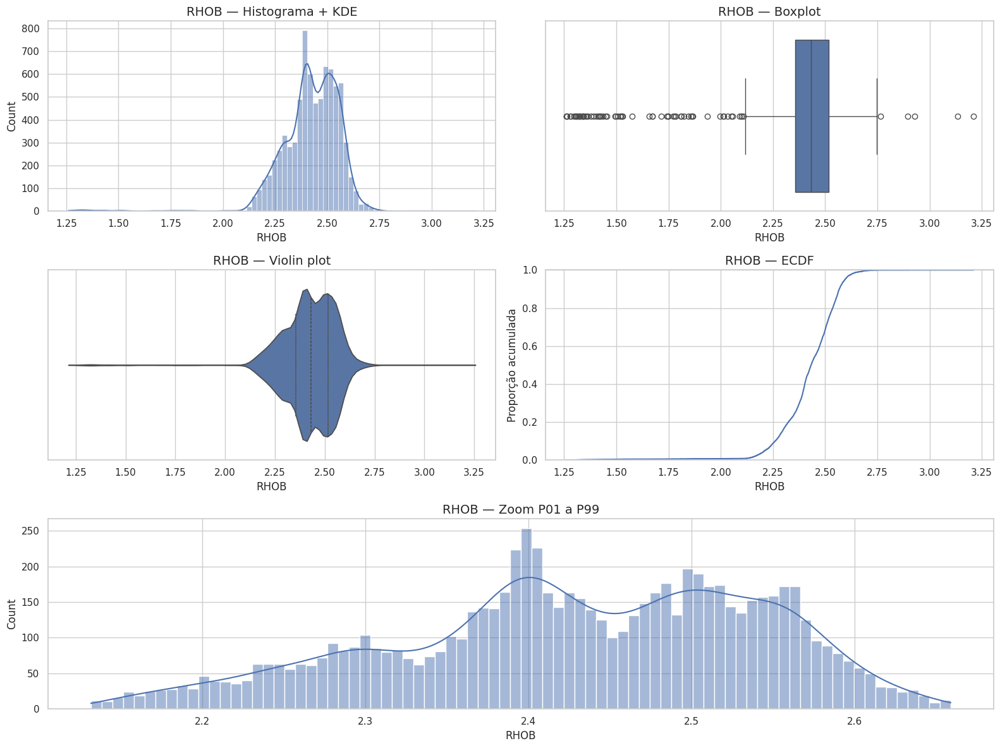

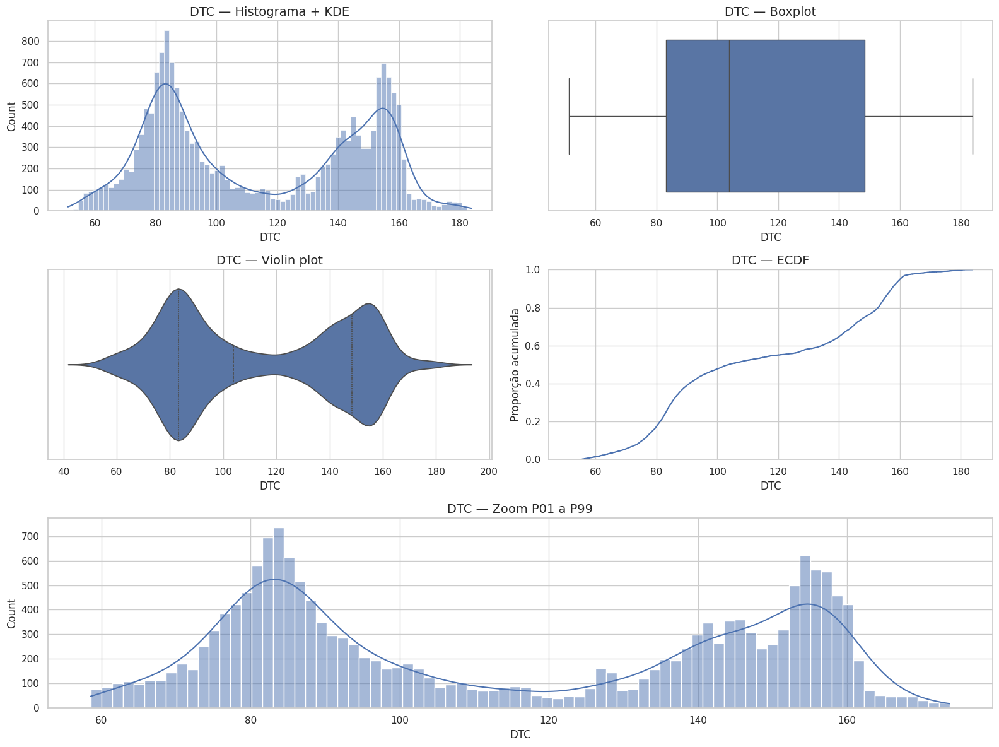

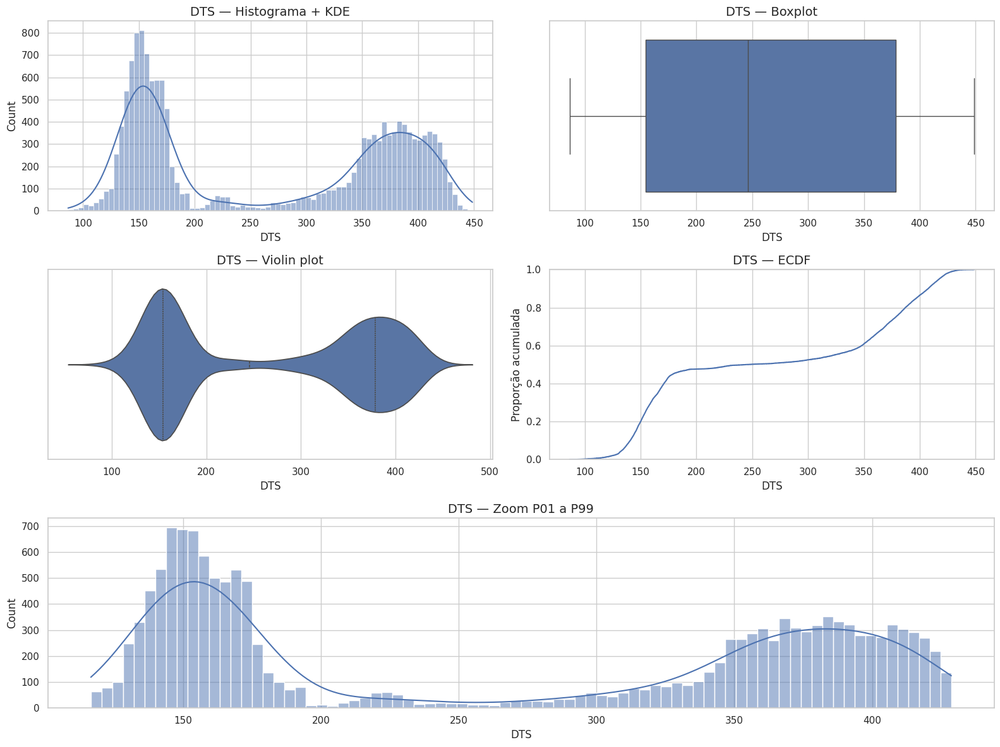

...

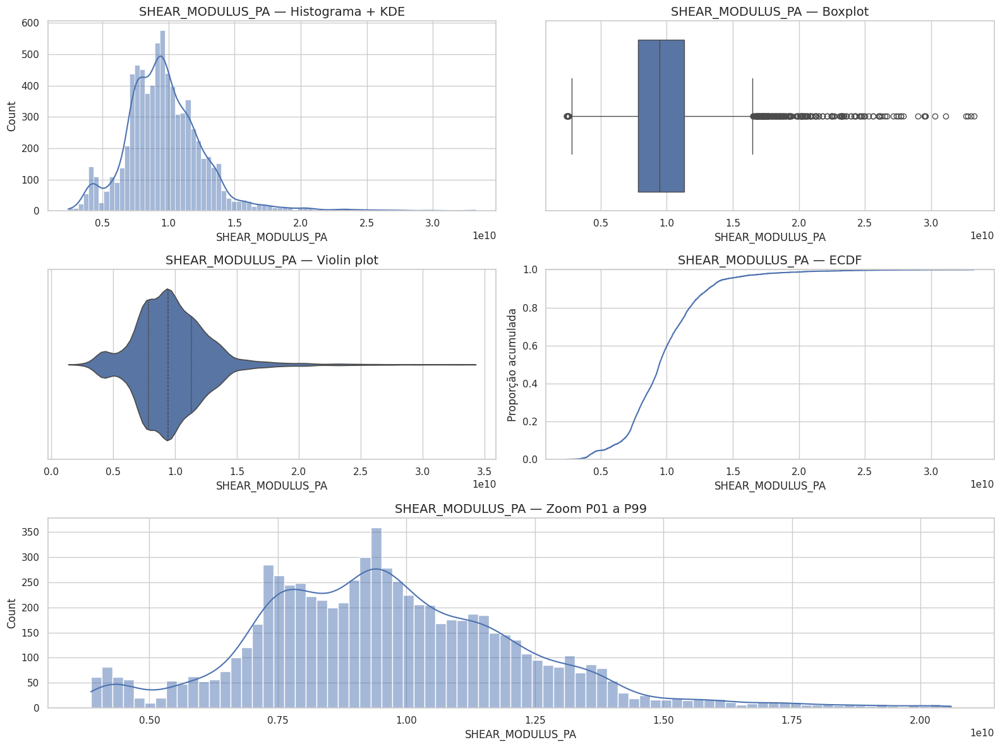

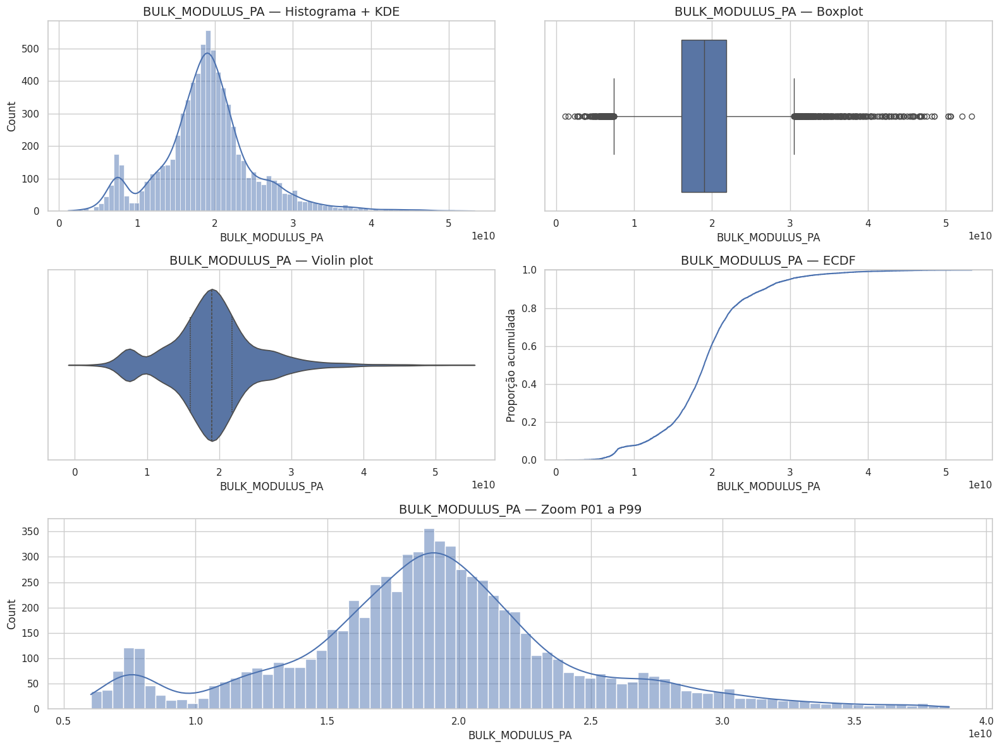

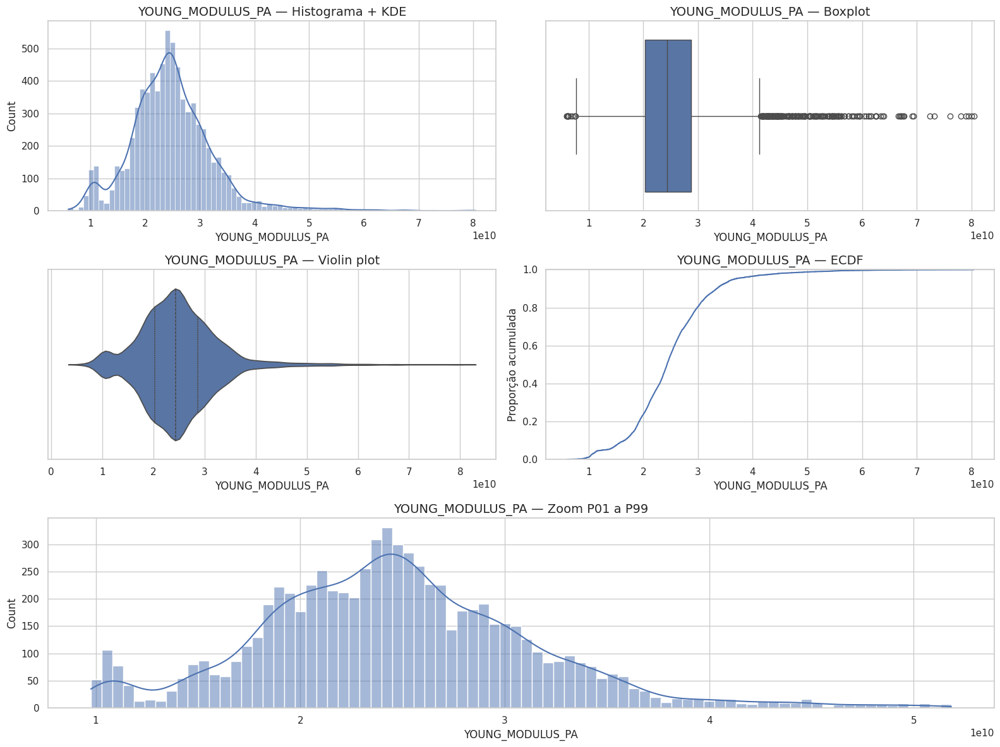

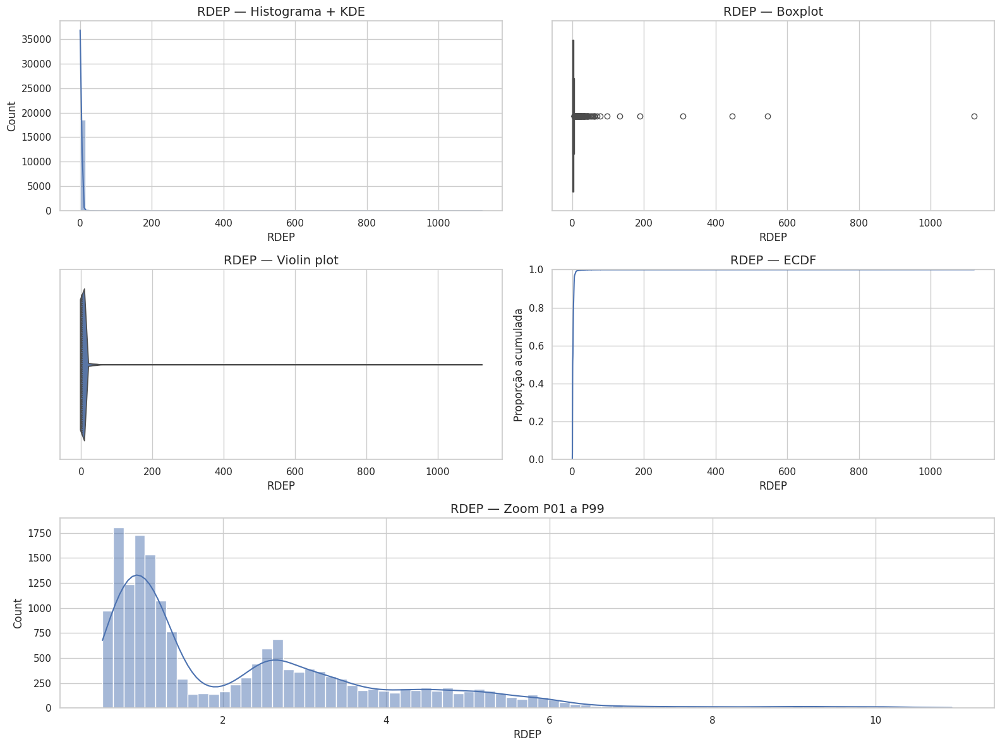

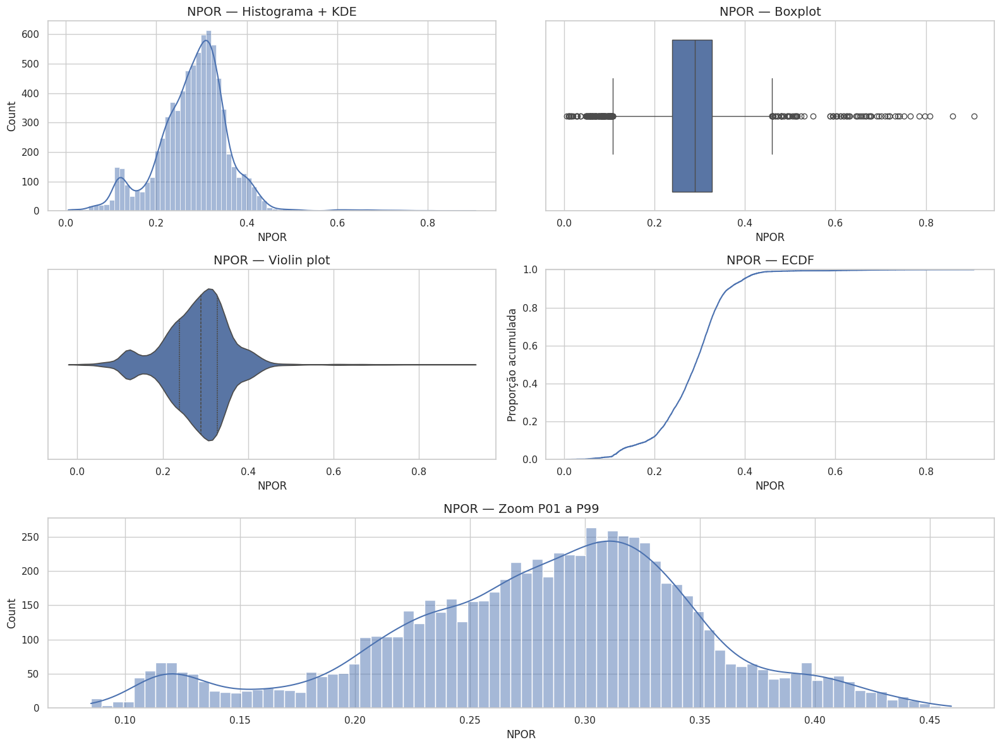

In [6]:
# ============================================================
# STEP 4.1 — DISTRIBUIÇÕES DAS PROPRIEDADES PRINCIPAIS
# ============================================================

for col in distribution_cols:
    plot_distribution_suite(df, col)

## Interpretação mental — distribuições

Cada conjunto de gráficos deve ser lido assim:

- Histograma + KDE mostra onde os valores se concentram;
- Boxplot mostra mediana, quartis e extremos;
- Violin plot mostra a forma da distribuição;
- ECDF mostra a proporção acumulada;
- Zoom P01–P99 ajuda a enxergar o corpo principal sem os extremos.

Conclusão prática:

Se uma propriedade apresenta múltiplos picos, ela pode estar mostrando heterogeneidade real.  
Se apresenta cauda extrema, pode ser outlier, mudança física ou problema de dado.

# STEP 5 — Resistivity in Log Scale

Resistividade quase nunca se comporta bem em escala linear.  
Por isso criamos `LOG10_RDEP`, `LOG10_RMED` e `LOG10_RSHA`, quando possível.

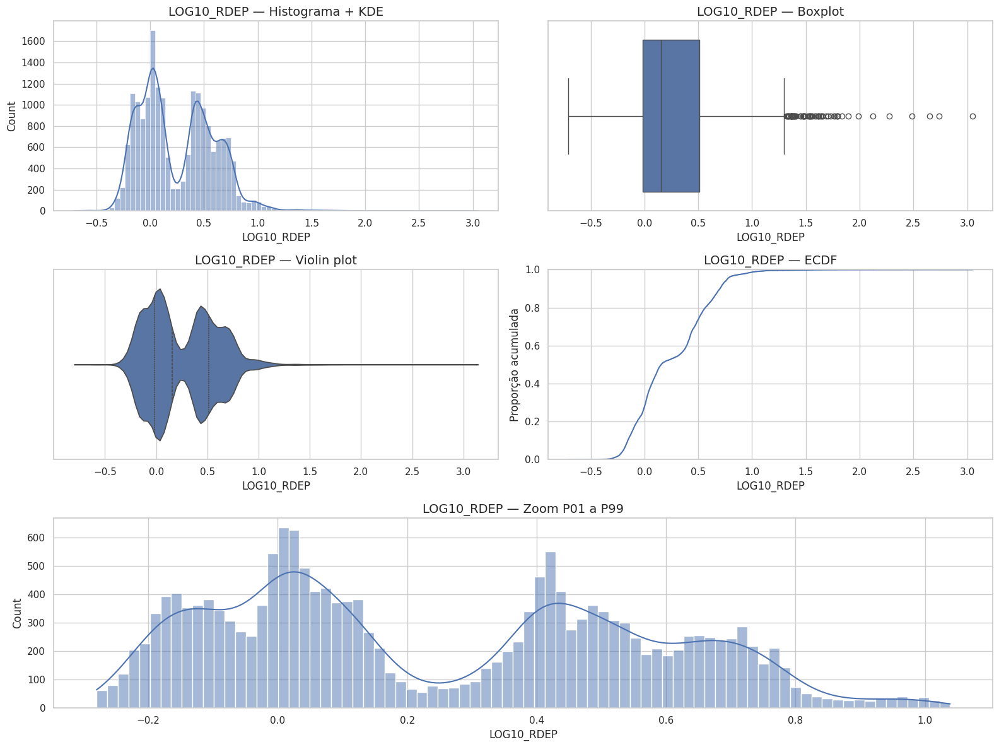

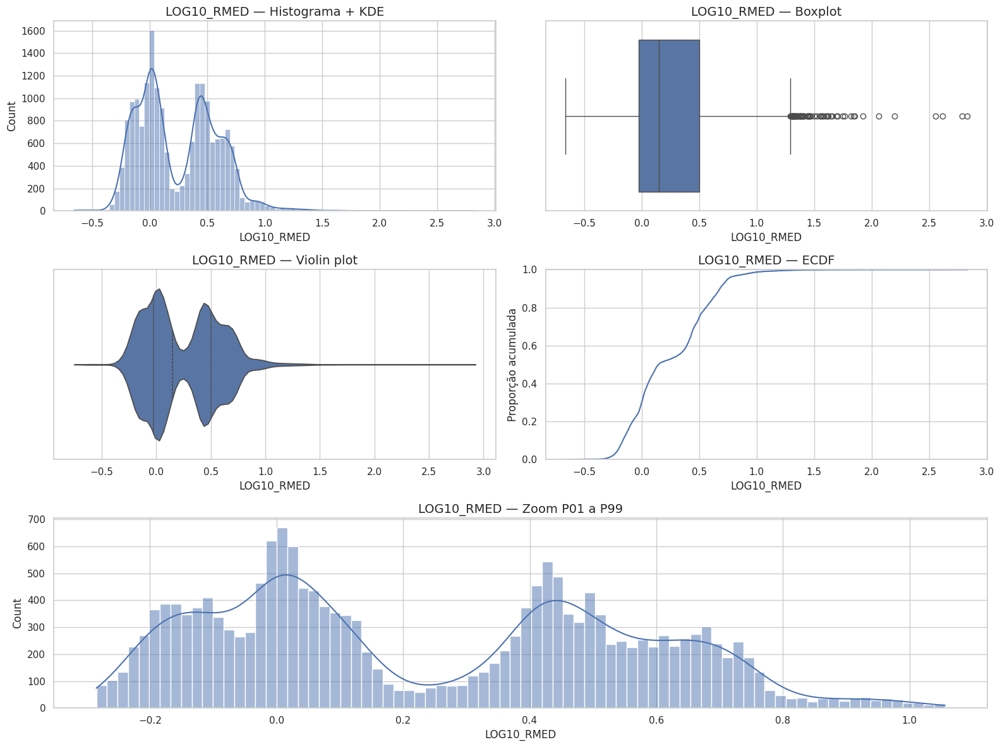

In [7]:
# ============================================================
# STEP 5 — RESISTIVITY IN LOG SCALE
# ============================================================

analytics_df = make_unique_columns(df).copy()

res_cols = [c for c in ["RDEP", "RMED", "RSHA"] if c in analytics_df.columns]

for col in res_cols:
    analytics_df[f"LOG10_{col}"] = np.log10(analytics_df[col].where(analytics_df[col] > 0))

for col in [f"LOG10_{c}" for c in res_cols]:
    if col in analytics_df.columns and analytics_df[col].notna().any():
        plot_distribution_suite(analytics_df, col, bins=80)

## Interpretação mental — resistividade em escala log

A escala log revela padrões que ficam escondidos na escala linear.

Conclusão prática:

Para resistividade, analise sempre também em `log10`.

# STEP 6 — Depth Log Plots

Agora voltamos ao eixo mais importante: profundidade.

Um log plot mostra como cada propriedade varia verticalmente.

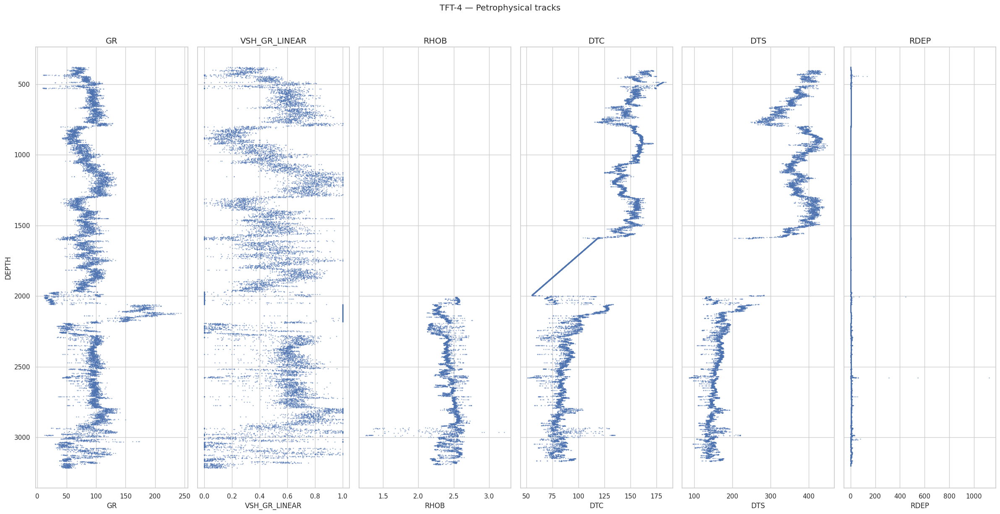

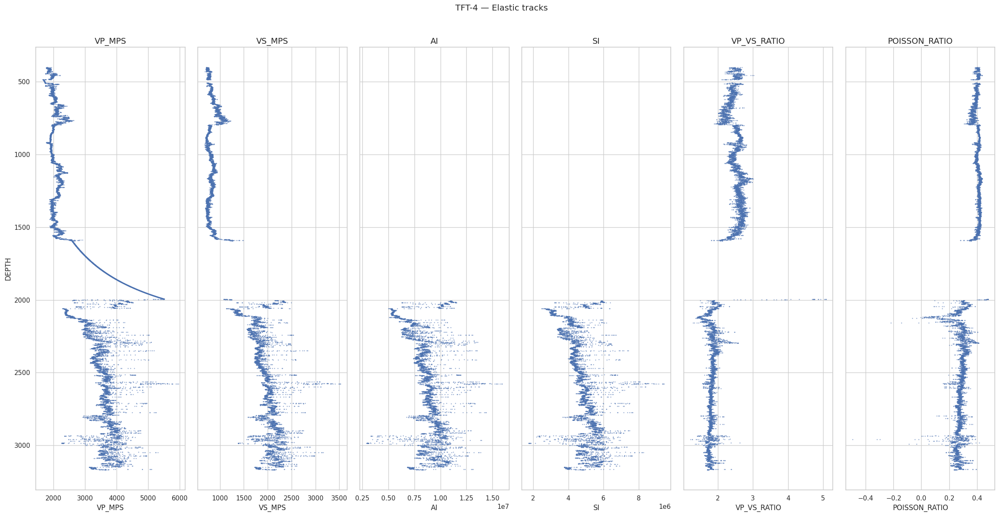

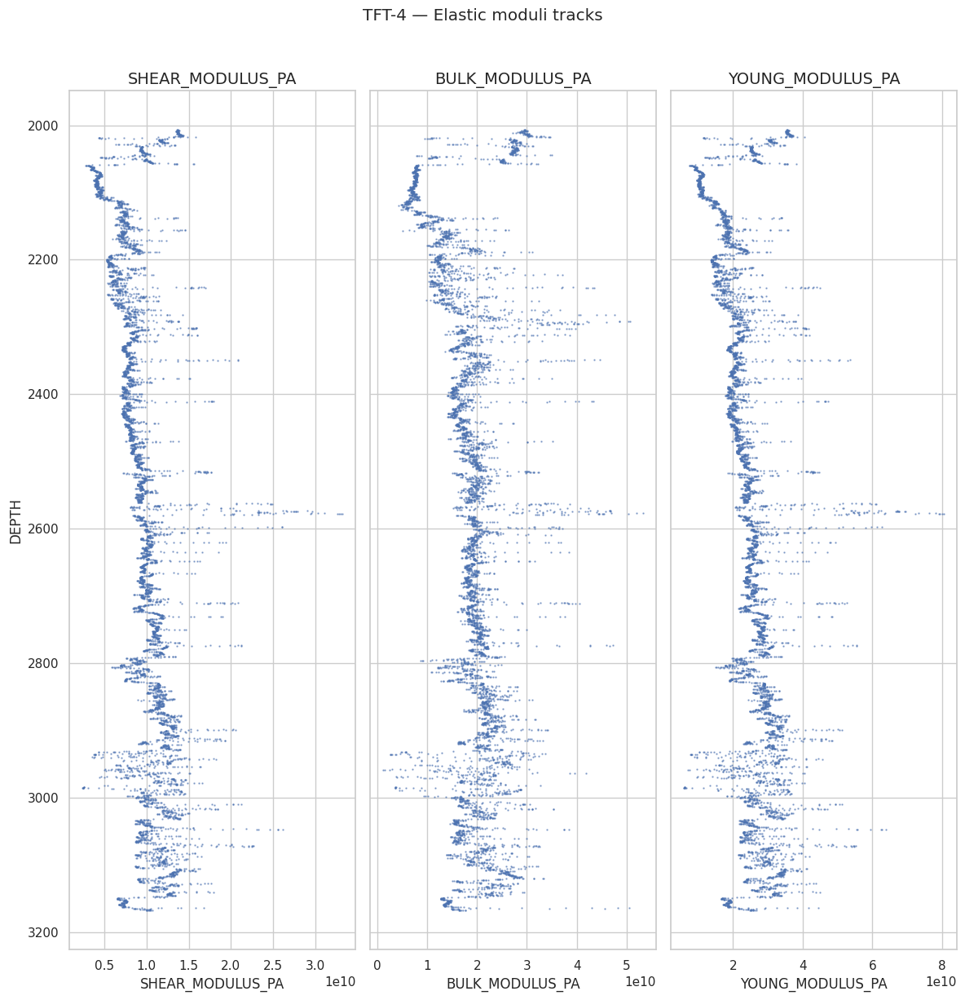

In [8]:
# ============================================================
# STEP 6 — DEPTH LOG PLOTS
# ============================================================

def plot_depth_tracks(df: pd.DataFrame, curves: List[str], depth_col: str = "DEPTH", title: str = "Depth tracks", max_points: int = 40_000) -> None:
    safe_df = make_unique_columns(df)

    curves = [c for c in curves if c in safe_df.columns and safe_df[c].notna().any()]

    if depth_col not in safe_df.columns:
        print(f"Coluna de profundidade não encontrada: {depth_col}")
        return

    if not curves:
        print("Nenhuma curva disponível.")
        return

    plot_df = safe_df[[depth_col] + curves].dropna(subset=[depth_col]).copy()

    if len(plot_df) > max_points:
        step = max(1, len(plot_df) // max_points)
        plot_df = plot_df.iloc[::step].copy()

    n = len(curves)
    fig, axes = plt.subplots(1, n, figsize=(4 * n, 12), sharey=True)

    if n == 1:
        axes = [axes]

    for ax, curve in zip(axes, curves):
        ax.plot(plot_df[curve], plot_df[depth_col], ".", markersize=1.5, alpha=0.55)
        ax.set_title(curve)
        ax.set_xlabel(curve)
        ax.grid(True)

    axes[0].invert_yaxis()
    axes[0].set_ylabel(depth_col)
    fig.suptitle(title, y=1.02)
    plt.tight_layout()
    plt.show()


plot_depth_tracks(
    analytics_df,
    ["GR", "VSH_GR_LINEAR", "RHOB", "DTC", "DTS", "RDEP"],
    title=f"{WELL_NAME} — Petrophysical tracks"
)

plot_depth_tracks(
    analytics_df,
    ["VP_MPS", "VS_MPS", "AI", "SI", "VP_VS_RATIO", "POISSON_RATIO"],
    title=f"{WELL_NAME} — Elastic tracks"
)

plot_depth_tracks(
    analytics_df,
    ["SHEAR_MODULUS_PA", "BULK_MODULUS_PA", "YOUNG_MODULUS_PA"],
    title=f"{WELL_NAME} — Elastic moduli tracks"
)

## Interpretação mental — log plots por profundidade

O eixo de profundidade transforma estatística em geologia.

- GR alto e VSH alto sugerem regiões mais argilosas;
- RHOB, VP, VS e AI aumentando com profundidade podem indicar compactação;
- Vp/Vs e Poisson podem indicar mudanças de fluido, litologia ou comportamento mecânico;
- módulos elásticos altos indicam rocha mais rígida.

Conclusão prática:

Com profundidade, você começa a ver a história vertical do poço.

# STEP 7 — Rolling Statistics

Rolling mean mostra tendência local.  
Rolling std mostra heterogeneidade local.

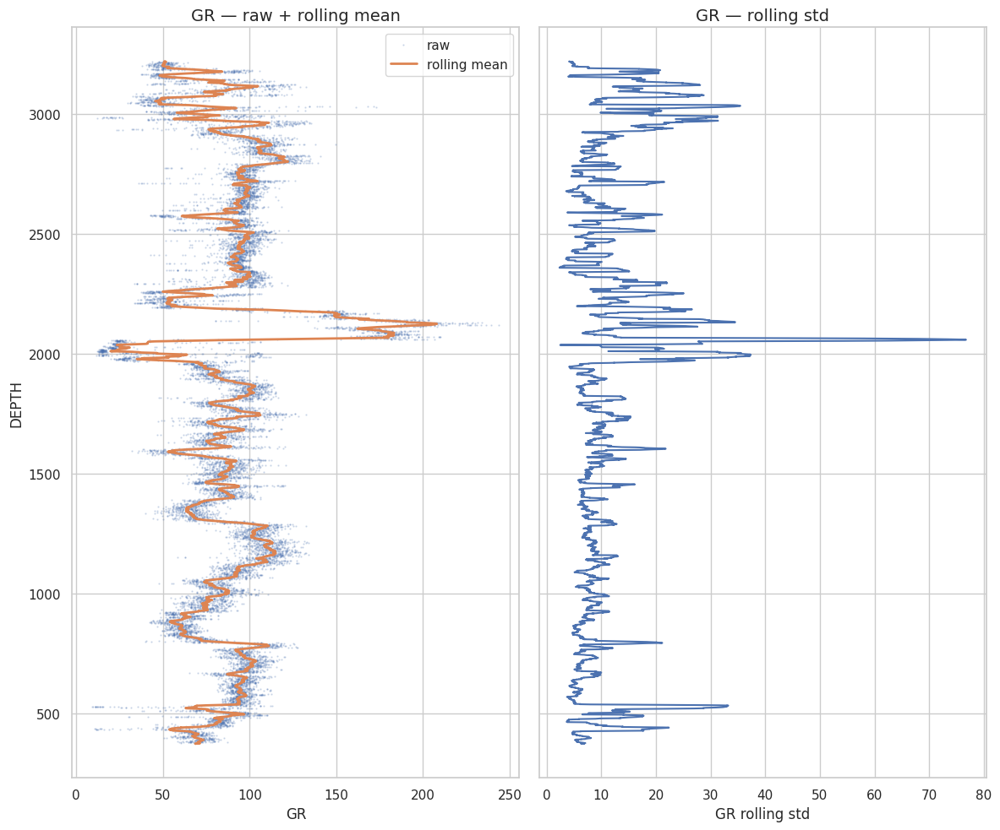

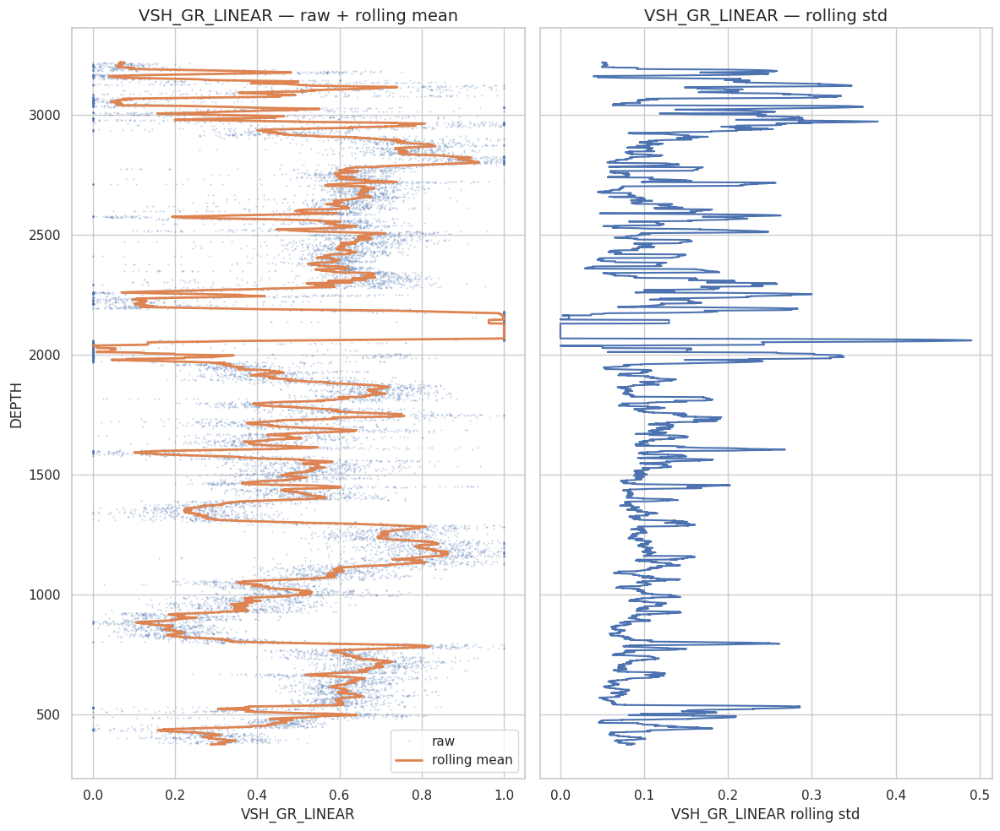

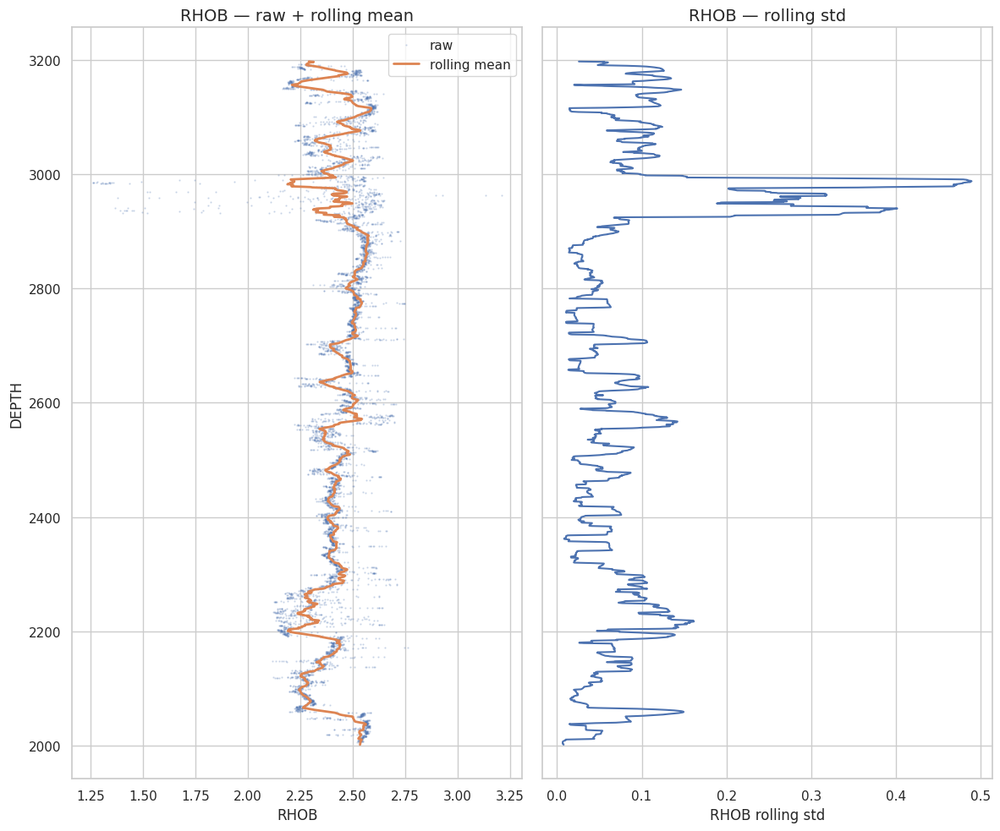

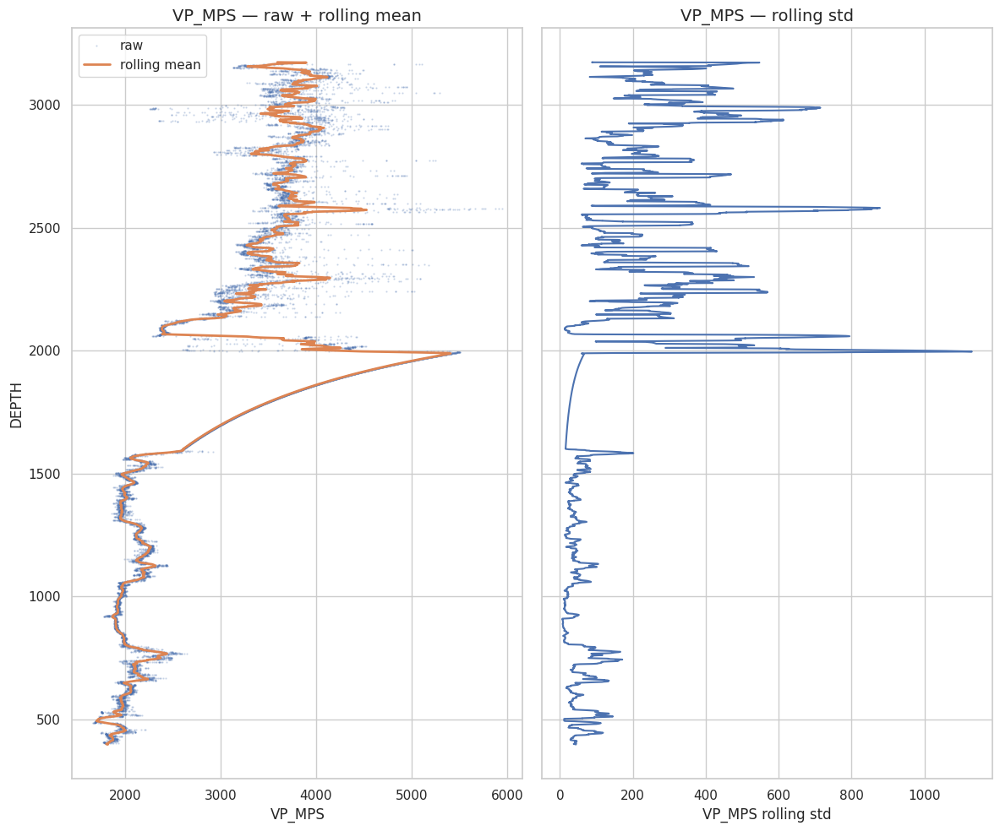

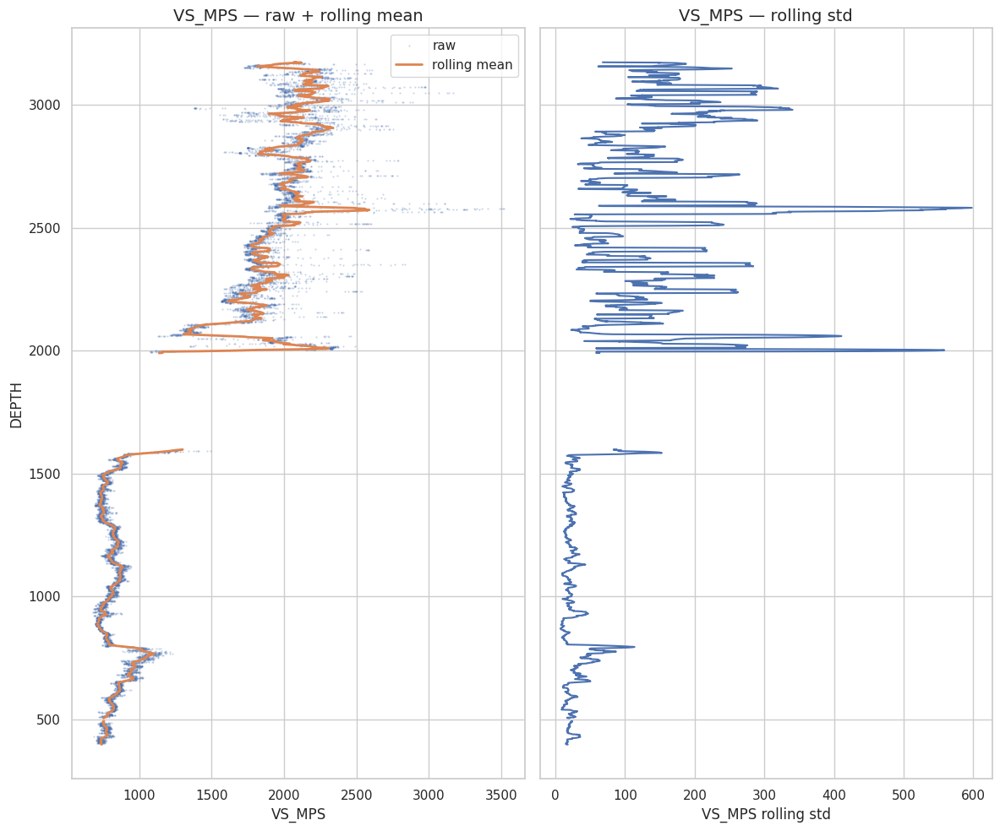

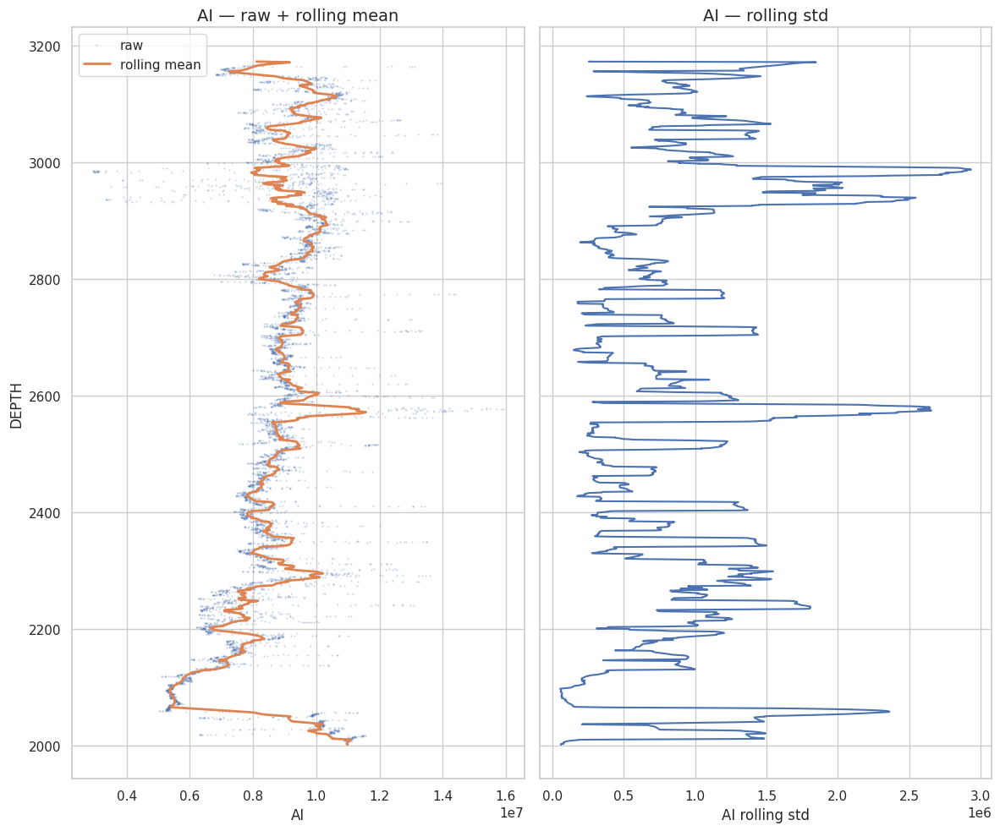

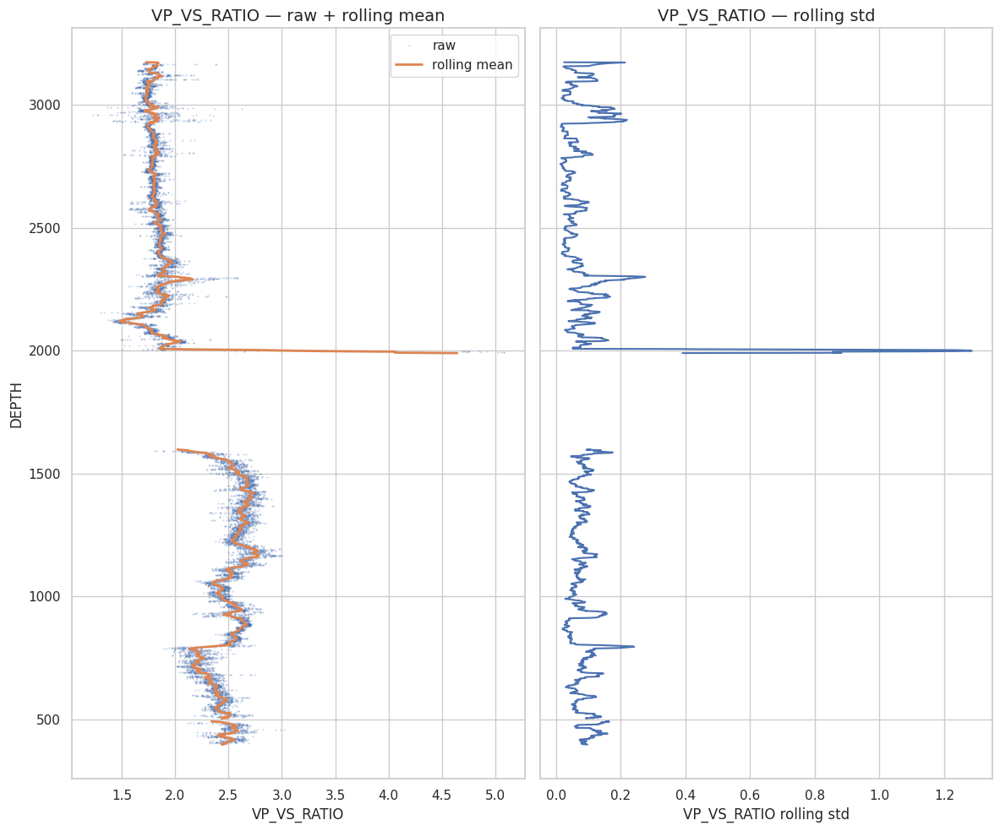

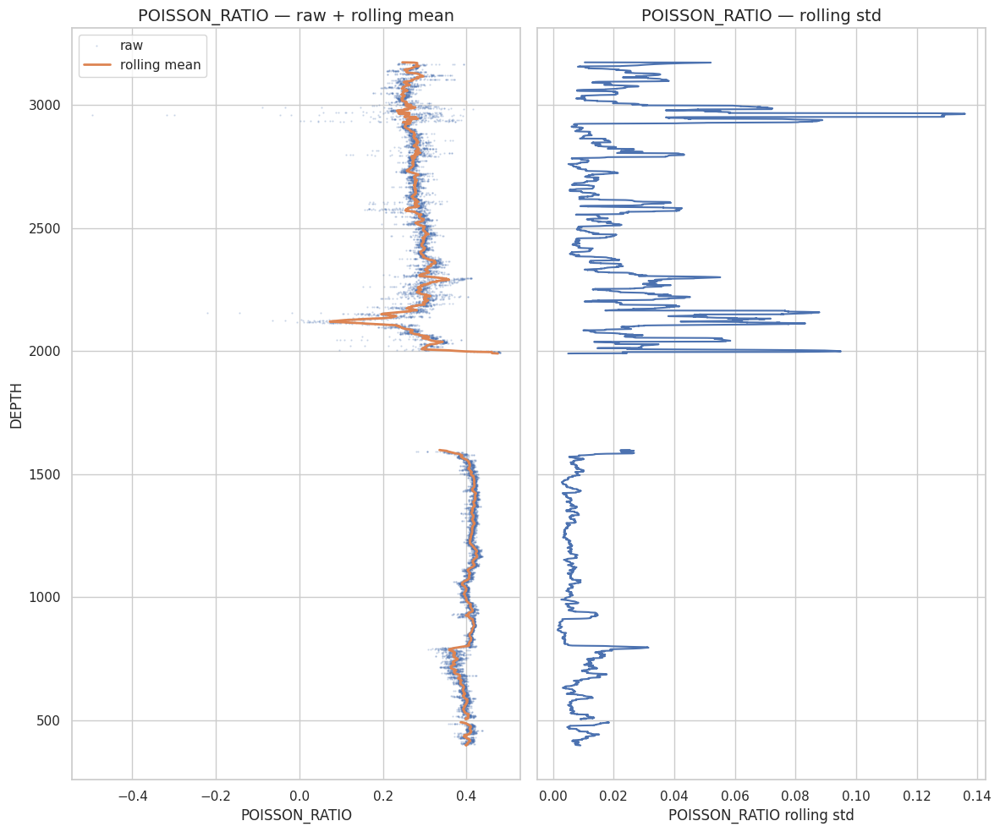

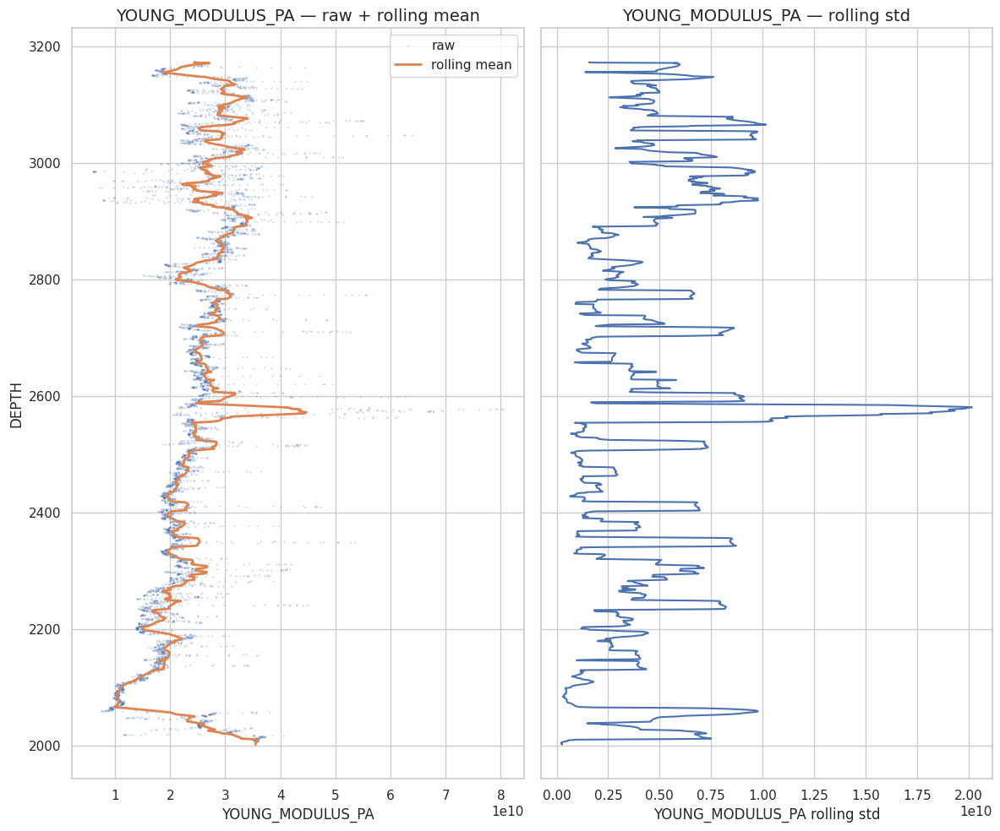

In [9]:
# ============================================================
# STEP 7 — ROLLING STATISTICS
# ============================================================

def add_rolling_features(df: pd.DataFrame, cols: List[str], window: int = 101) -> pd.DataFrame:
    out = make_unique_columns(df).sort_values("DEPTH").copy()

    for col in cols:
        if col not in out.columns or not out[col].notna().any():
            continue

        out[f"{col}_ROLL_MEAN"] = out[col].rolling(window=window, center=True, min_periods=max(5, window // 5)).mean()
        out[f"{col}_ROLL_STD"] = out[col].rolling(window=window, center=True, min_periods=max(5, window // 5)).std()

    return out


rolling_cols = [c for c in ["GR", "VSH_GR_LINEAR", "RHOB", "VP_MPS", "VS_MPS", "AI", "VP_VS_RATIO", "POISSON_RATIO", "YOUNG_MODULUS_PA"] if c in analytics_df.columns]

analytics_df = add_rolling_features(analytics_df, rolling_cols, window=101)


def plot_rolling(df: pd.DataFrame, col: str) -> None:
    safe_df = make_unique_columns(df)

    if col not in safe_df.columns:
        return

    mean_col = f"{col}_ROLL_MEAN"
    std_col = f"{col}_ROLL_STD"

    if mean_col not in safe_df.columns or std_col not in safe_df.columns:
        return

    fig, axes = plt.subplots(1, 2, figsize=(12, 10), sharey=True)

    axes[0].plot(safe_df[col], safe_df["DEPTH"], ".", markersize=1.2, alpha=0.25, label="raw")
    axes[0].plot(safe_df[mean_col], safe_df["DEPTH"], "-", linewidth=2, label="rolling mean")
    axes[0].invert_yaxis()
    axes[0].set_title(f"{col} — raw + rolling mean")
    axes[0].set_xlabel(col)
    axes[0].set_ylabel("DEPTH")
    axes[0].legend()

    axes[1].plot(safe_df[std_col], safe_df["DEPTH"], "-", linewidth=1.5)
    axes[1].invert_yaxis()
    axes[1].set_title(f"{col} — rolling std")
    axes[1].set_xlabel(f"{col} rolling std")

    plt.tight_layout()
    plt.show()


for col in rolling_cols:
    plot_rolling(analytics_df, col)

## Interpretação mental — rolling mean e rolling std

Rolling mean ajuda a ver tendência.  
Rolling std ajuda a ver instabilidade.

Juntas, elas ajudam a separar intervalos homogêneos de intervalos complexos.

# STEP 8 — Correlation Analysis

Agora estudamos relações entre propriedades usando correlação Spearman.

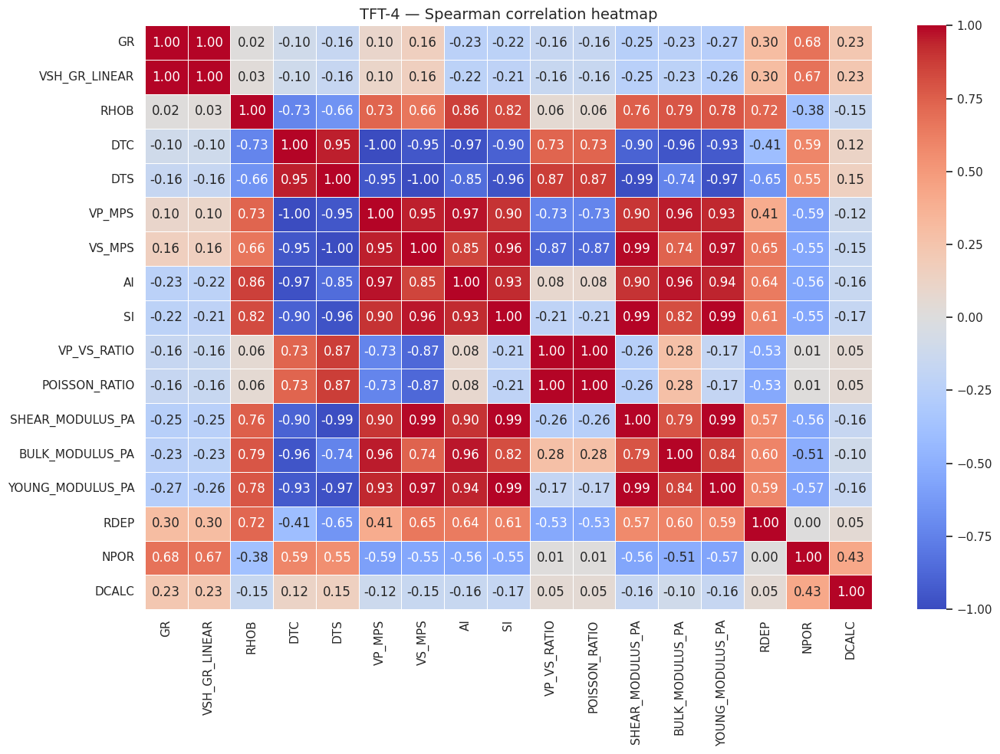

In [10]:
# ============================================================
# STEP 8 — CORRELATION ANALYSIS
# ============================================================

corr_cols = [
    "GR", "VSH_GR_LINEAR", "RHOB", "DTC", "DTS",
    "VP_MPS", "VS_MPS", "AI", "SI", "VP_VS_RATIO",
    "POISSON_RATIO", "SHEAR_MODULUS_PA", "BULK_MODULUS_PA",
    "YOUNG_MODULUS_PA", "RDEP", "NPOR", "DCALC"
]

corr_cols = [c for c in corr_cols if c in analytics_df.columns and analytics_df[c].notna().sum() > 10]

corr_df = analytics_df[corr_cols].corr(method="spearman")

plt.figure(figsize=(14, 10))
sns.heatmap(corr_df, annot=True, fmt=".2f", cmap="coolwarm", center=0, linewidths=0.5)
plt.title(f"{WELL_NAME} — Spearman correlation heatmap")
plt.tight_layout()
plt.show()

corr_df.to_csv(REPORT_DIR / f"{WELL_NAME}_spearman_correlation.csv")

## Interpretação mental — mapa de correlação

Correlação é bússola, não sentença final.

- próximo de +1: crescem juntas;
- próximo de -1: uma cresce enquanto outra diminui;
- próximo de 0: sem relação monotônica simples.

Conclusão prática:

Correlação ajuda a escolher crossplots e hipóteses, mas não prova causalidade.

# STEP 9 — Crossplots

Crossplots mostram relações entre propriedades e podem revelar populações, tendências, anomalias e clusters físicos.

Esta versão usa uma função corrigida e robusta contra colunas duplicadas.

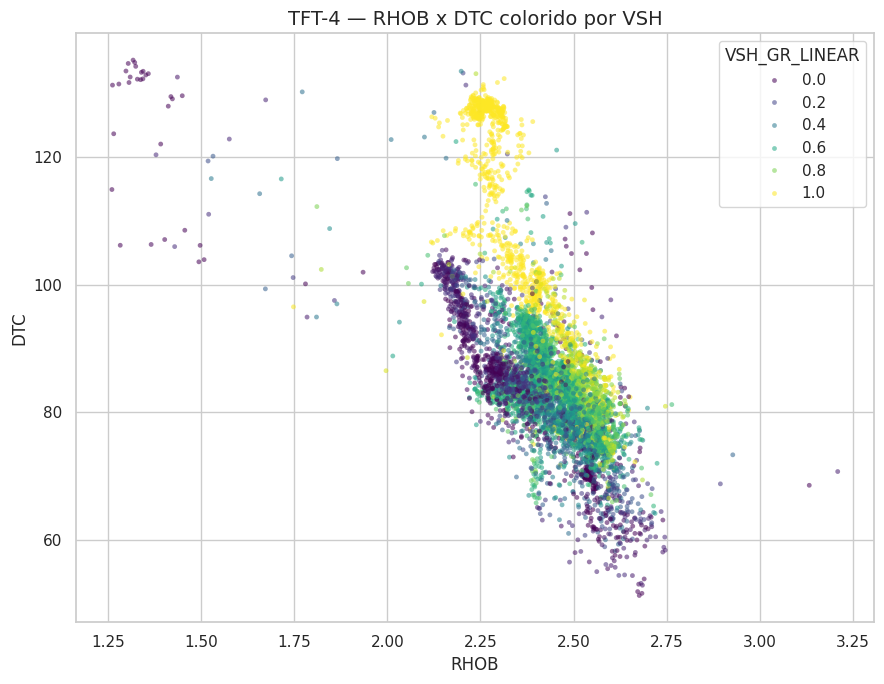

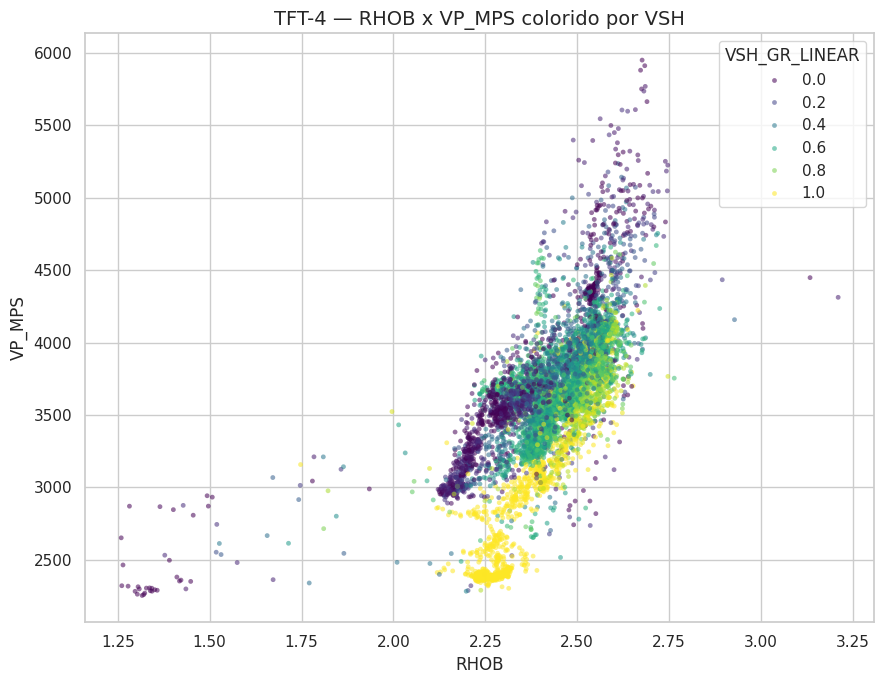

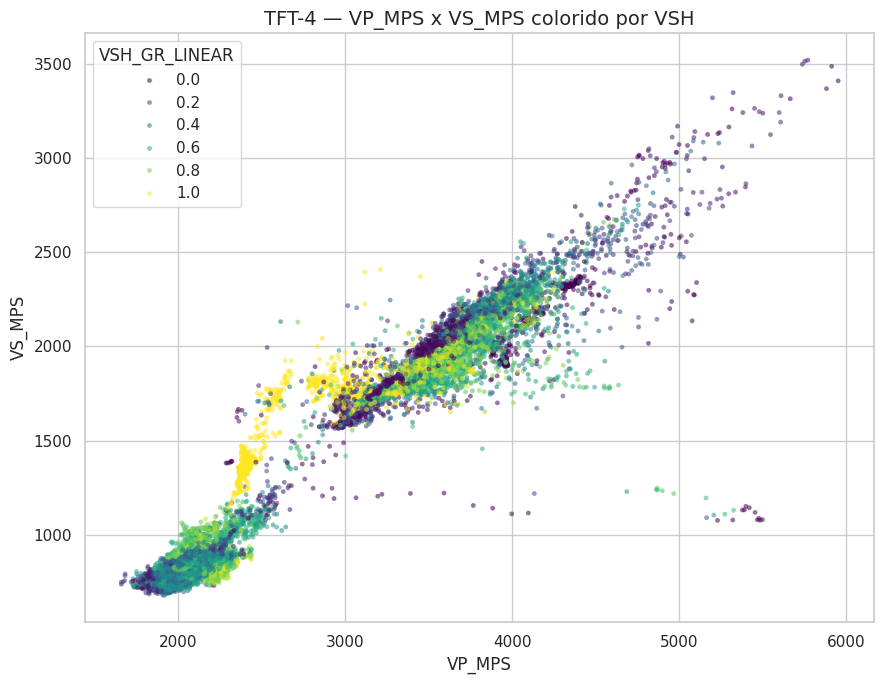

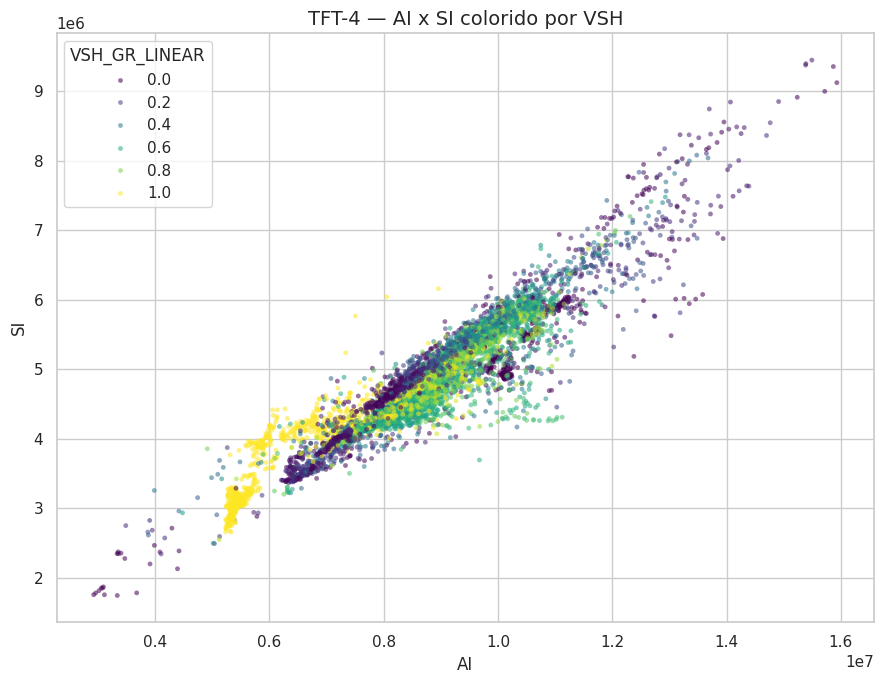

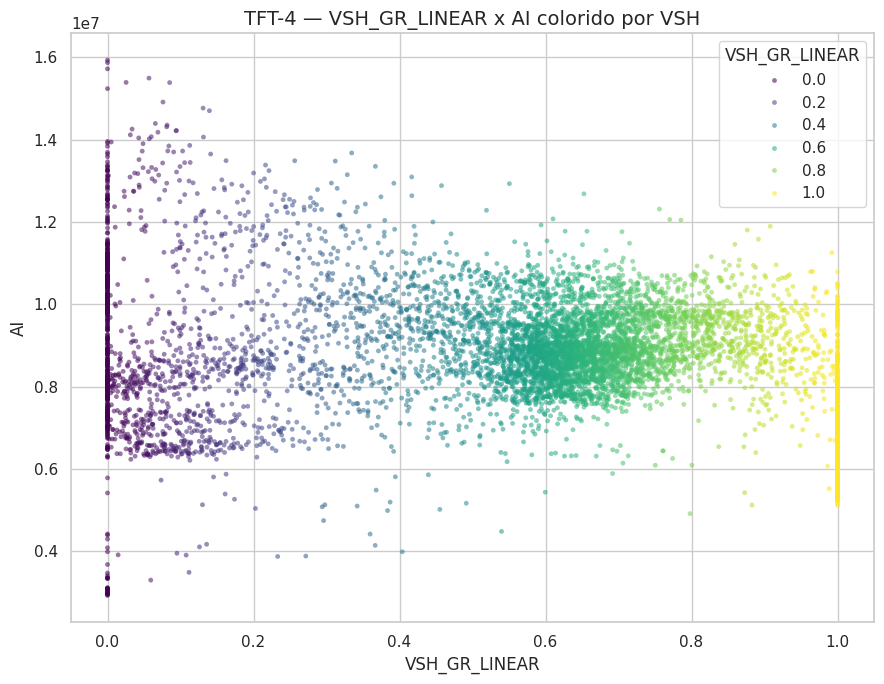

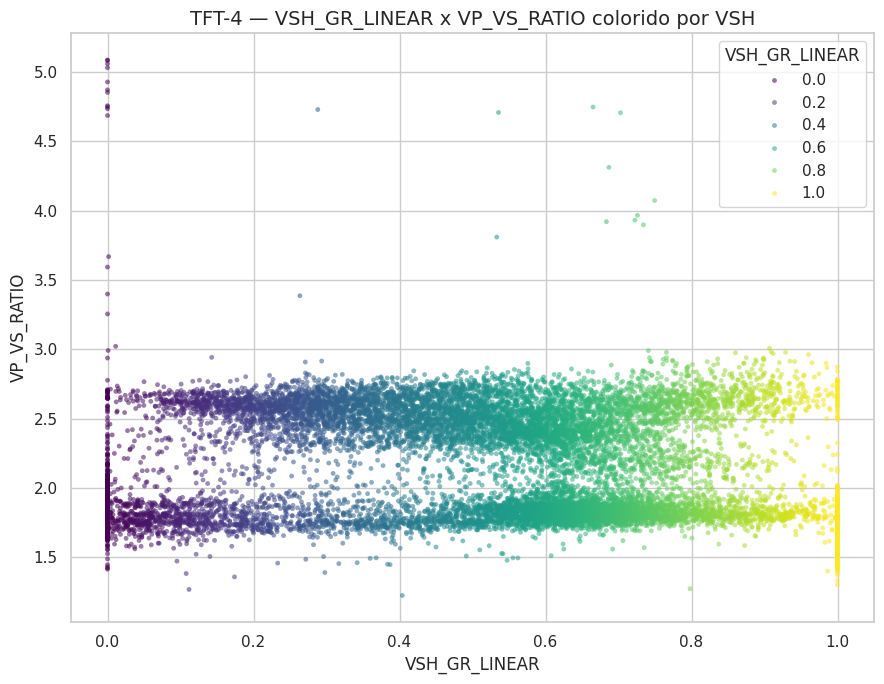

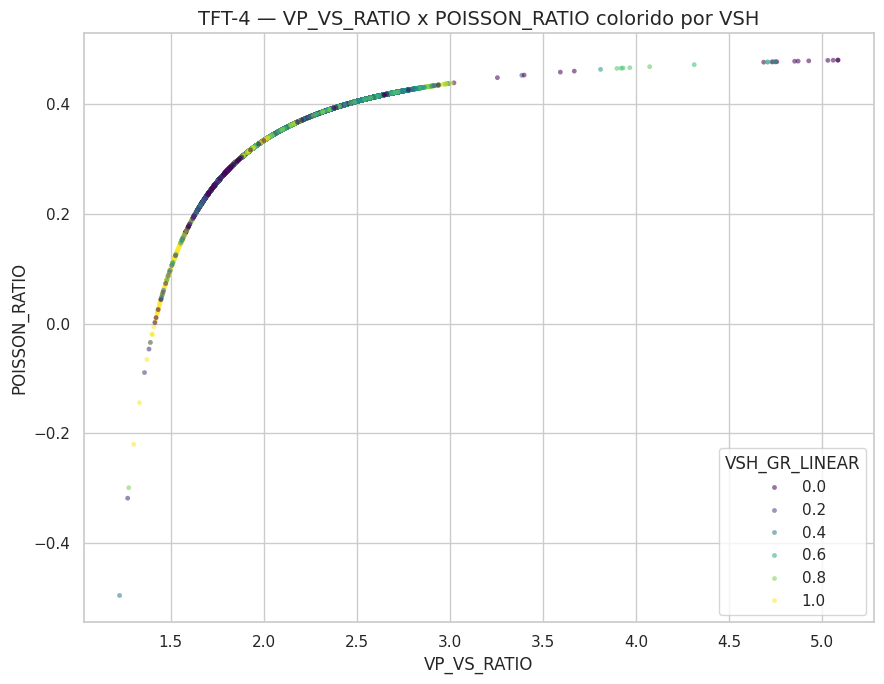

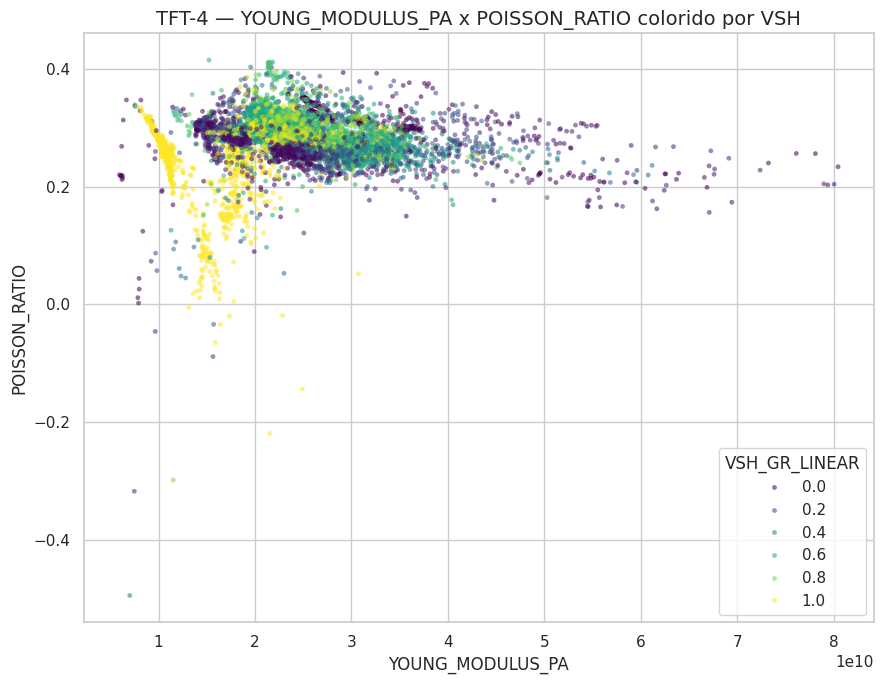

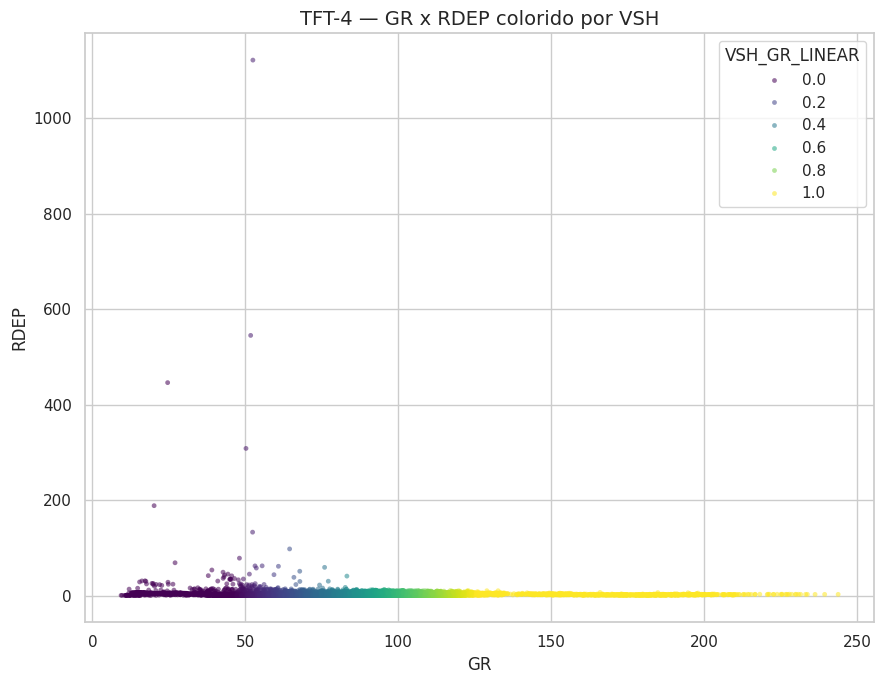

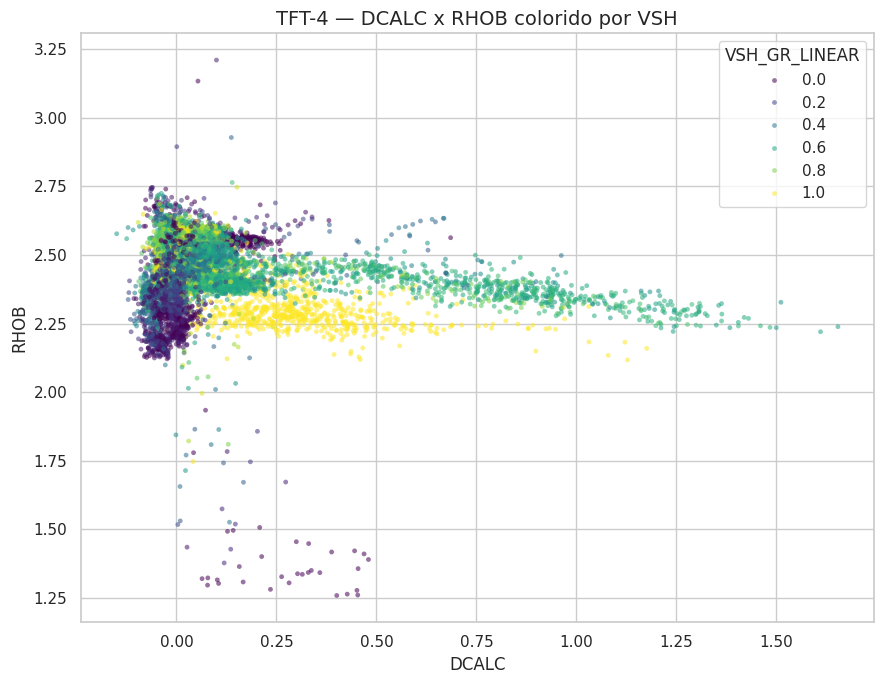

In [11]:
# ============================================================
# STEP 9 — CROSSPLOTS — VERSÃO CORRIGIDA
# ============================================================

def scatter_crossplot(
    df: pd.DataFrame,
    x: str,
    y: str,
    hue: Optional[str] = None,
    title: Optional[str] = None,
    sample: int = 50_000
) -> None:
    """
    Crossplot seguro contra:
    - colunas duplicadas;
    - colunas ausentes;
    - dados não numéricos;
    - hue duplicado;
    - DataFrame vazio.
    """

    safe_df = make_unique_columns(df)

    required_cols = [x, y]

    if hue and hue in safe_df.columns and hue not in required_cols:
        required_cols.append(hue)

    missing = [c for c in required_cols if c not in safe_df.columns]

    if missing:
        print(f"Ignorando crossplot {x} x {y}. Colunas ausentes: {missing}")
        return

    plot_df = safe_df[required_cols].copy()

    # Converte explicitamente cada coluna para série numérica 1D.
    for col in required_cols:
        plot_df[col] = pd.to_numeric(plot_df[col], errors="coerce")

    plot_df = plot_df.dropna()

    if plot_df.empty:
        print(f"Sem dados válidos para {x} x {y}")
        return

    if len(plot_df) > sample:
        plot_df = plot_df.sample(sample, random_state=42)

    plt.figure(figsize=(9, 7))

    if hue and hue in plot_df.columns:
        sns.scatterplot(
            data=plot_df,
            x=x,
            y=y,
            hue=hue,
            s=12,
            alpha=0.55,
            linewidth=0,
            palette="viridis"
        )
    else:
        sns.scatterplot(
            data=plot_df,
            x=x,
            y=y,
            s=12,
            alpha=0.55,
            linewidth=0
        )

    plt.title(title or f"{x} x {y}")
    plt.tight_layout()
    plt.show()


crossplot_pairs = [
    ("RHOB", "DTC"),
    ("RHOB", "VP_MPS"),
    ("VP_MPS", "VS_MPS"),
    ("AI", "SI"),
    ("VSH_GR_LINEAR", "AI"),
    ("VSH_GR_LINEAR", "VP_VS_RATIO"),
    ("VP_VS_RATIO", "POISSON_RATIO"),
    ("YOUNG_MODULUS_PA", "POISSON_RATIO"),
    ("GR", "RDEP"),
    ("DCALC", "RHOB"),
]

for x, y in crossplot_pairs:
    scatter_crossplot(
        analytics_df,
        x,
        y,
        hue="VSH_GR_LINEAR",
        title=f"{WELL_NAME} — {x} x {y} colorido por VSH"
    )

## Interpretação mental — crossplots

Como ler crossplots:

- nuvem compacta indica relação mais estável;
- nuvem espalhada indica heterogeneidade, ruído ou múltiplos controles físicos;
- grupos separados podem indicar diferentes litologias ou zonas;
- pontos isolados podem ser anomalias ou fenômenos importantes;
- cor por VSH ajuda a separar regiões limpas e argilosas.

Conclusão prática:

Crossplot é onde você começa a ver famílias físicas dentro dos dados.

# STEP 10 — Depth Interval Summary

Dividimos o poço em intervalos de 50m para estudar comportamento vertical agregado.

In [12]:
# ============================================================
# STEP 10 — DEPTH INTERVAL SUMMARY
# ============================================================

def build_depth_intervals(df: pd.DataFrame, interval_size: float = 50.0) -> pd.DataFrame:
    out = make_unique_columns(df).copy()

    depth_min = np.floor(out["DEPTH"].min() / interval_size) * interval_size
    depth_max = np.ceil(out["DEPTH"].max() / interval_size) * interval_size

    bins = np.arange(depth_min, depth_max + interval_size, interval_size)

    out["DEPTH_INTERVAL"] = pd.cut(out["DEPTH"], bins=bins, include_lowest=True)

    return out


analytics_df = build_depth_intervals(analytics_df, interval_size=50.0)

summary_metrics = [c for c in [
    "GR", "VSH_GR_LINEAR", "RHOB", "VP_MPS", "VS_MPS", "AI", "SI",
    "VP_VS_RATIO", "POISSON_RATIO", "YOUNG_MODULUS_PA", "RDEP",
    "QC_FLAG_COUNT", "FEATURE_QC_FLAG_COUNT"
] if c in analytics_df.columns]

interval_summary = (
    analytics_df
    .groupby("DEPTH_INTERVAL", observed=True)[summary_metrics]
    .agg(["count", "mean", "median", "std", "min", "max"])
)

interval_summary.columns = [f"{col}_{stat}" for col, stat in interval_summary.columns]
interval_summary = interval_summary.reset_index()

display(interval_summary.head(30))
interval_summary.to_csv(REPORT_DIR / f"{WELL_NAME}_depth_interval_summary_50m.csv", index=False)

,DEPTH_INTERVAL,GR_count,GR_mean,GR_median,GR_std,GR_min,GR_max,VSH_GR_LINEAR_count,VSH_GR_LINEAR_mean,VSH_GR_LINEAR_median,VSH_GR_LINEAR_std,VSH_GR_LINEAR_min,VSH_GR_LINEAR_max,RHOB_count,RHOB_mean,RHOB_median,RHOB_std,RHOB_min,RHOB_max,VP_MPS_count,VP_MPS_mean,VP_MPS_median,VP_MPS_std,VP_MPS_min,VP_MPS_max,VS_MPS_count,VS_MPS_mean,VS_MPS_median,VS_MPS_std,VS_MPS_min,VS_MPS_max,AI_count,AI_mean,AI_median,AI_std,AI_min,AI_max,SI_count,SI_mean,SI_median,SI_std,SI_min,SI_max,VP_VS_RATIO_count,VP_VS_RATIO_mean,VP_VS_RATIO_median,VP_VS_RATIO_std,VP_VS_RATIO_min,VP_VS_RATIO_max,POISSON_RATIO_count,POISSON_RATIO_mean,POISSON_RATIO_median,POISSON_RATIO_std,POISSON_RATIO_min,POISSON_RATIO_max,YOUNG_MODULUS_PA_count,YOUNG_MODULUS_PA_mean,YOUNG_MODULUS_PA_median,YOUNG_MODULUS_PA_std,YOUNG_MODULUS_PA_min,YOUNG_MODULUS_PA_max,RDEP_count,RDEP_mean,RDEP_median,RDEP_std,RDEP_min,RDEP_max,QC_FLAG_COUNT_count,QC_FLAG_COUNT_mean,QC_FLAG_COUNT_median,QC_FLAG_COUNT_std,QC_FLAG_COUNT_min,QC_FLAG_COUNT_max,FEATURE_QC_FLAG_COUNT_count,FEATURE_QC_FLAG_COUNT_mean,FEATURE_QC_FLAG_COUNT_median,FEATURE_QC_FLAG_COUNT_std,FEATURE_QC_FLAG_COUNT_min,FEATURE_QC_FLAG_COUNT_max
0,"(349.999, 400.0]",133,72.175420,72.242050,5.833188,58.586002,87.171234,133,0.332012,0.332848,0.073152,0.161592,0.520070,0,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,133,0.959539,0.973023,0.198969,0.643297,1.955543,185,0.000000,0.000000,0.000000,0,0,185,0.000000,0.000000,0.000000,0,0
1,"(400.0, 450.0]",329,64.520900,66.391663,13.702928,10.533463,90.093803,329,0.253809,0.259480,0.119696,0.000000,0.556721,0,NaN,NaN,NaN,NaN,NaN,316,"1,865.078921","1,853.017968",73.363325,"1,743.058420","2,108.241461",269,751.688055,747.381158,29.416531,688.511086,825.364100,0,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,269,2.498125,2.500799,0.117501,2.204506,2.756281,269,0.403620,0.404834,0.011111,0.370461,0.424209,0,NaN,NaN,NaN,NaN,NaN,329,4.609453,3.592734,9.922278,0.241039,132.887711,329,1.316109,2.000000,1.206088,0,6,329,0.000000,0.000000,0.000000,0,0
2,"(450.0, 500.0]",329,84.193426,84.235153,11.883867,30.279743,110.261375,329,0.484049,0.483250,0.143869,0.000000,0.809637,0,NaN,NaN,NaN,NaN,NaN,329,"1,881.189331","1,930.445795",128.706319,"1,657.675508","2,213.618057",242,766.168089,766.781033,21.729782,714.484379,808.998471,0,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,242,2.542417,2.542662,0.113869,2.116289,3.021750,242,0.407635,0.408511,0.010541,0.356267,0.438507,0,NaN,NaN,NaN,NaN,NaN,329,2.773447,2.504238,1.015354,0.719508,9.173361,329,0.671733,0.000000,0.966744,0,4,329,0.000000,0.000000,0.000000,0,0
3,"(500.0, 550.0]",328,80.238682,87.845253,22.267244,9.397405,113.031723,328,0.459771,0.528523,0.210742,0.000000,0.844379,0,NaN,NaN,NaN,NaN,NaN,328,"1,894.150531","1,934.075893",118.510040,"1,716.203182","2,171.345921",240,800.016329,808.276047,29.394996,718.401835,848.787686,0,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,240,2.441503,2.418472,0.102490,2.179094,2.720979,240,0.398422,0.396886,0.009986,0.366612,0.421920,0,NaN,NaN,NaN,NaN,NaN,328,2.436578,2.541057,0.969029,0.405355,8.701209,328,0.347561,0.000000,0.817204,0,6,328,0.000000,0.000000,0.000000,0,0
4,"(550.0, 600.0]",329,94.661592,93.793961,5.554275,81.145592,112.565254,329,0.614005,0.603124,0.069654,0.444505,0.838529,0,NaN,NaN,NaN,NaN,NaN,329,"1,960.957833","1,965.292722",37.211073,"1,852.040428","2,040.170728",329,808.754981,809.534128,24.050935,738.840983,896.639597,0,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,329,2.426891,2.422366,0.088151,2.160011,2.698806,329,0.397116,0.397285,0.009189,0.363599,0.420427,0,NaN,NaN,NaN,NaN,NaN,329,2.528301,2.543618,0.167992,1.992782,2.808760,329,0.036474,0.000000,0.268023,0,2,329,0.000000,0.000000,0.000000,0,0
5,"(600.0, 650.0]",329,94.966706,94.765976,5.413825,81.802986,111.133415,329,0.617831,0.615314,0.067893,0.452749,0.820573,0,NaN,NaN,NaN,NaN,NaN,329,"2,042.812156","2,053.216824",3

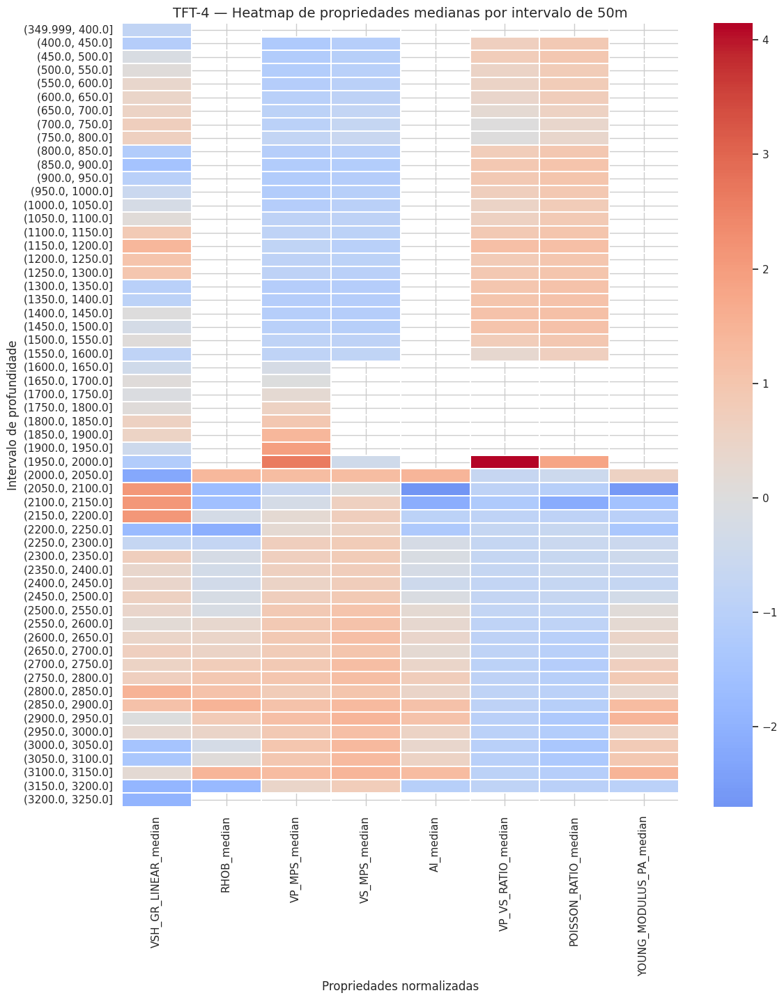

In [13]:
# ============================================================
# STEP 10.1 — HEATMAP DE INTERVALOS
# ============================================================

heatmap_cols = [c for c in [
    "VSH_GR_LINEAR_median", "RHOB_median", "VP_MPS_median",
    "VS_MPS_median", "AI_median", "VP_VS_RATIO_median",
    "POISSON_RATIO_median", "YOUNG_MODULUS_PA_median"
] if c in interval_summary.columns]

heatmap_df = interval_summary[["DEPTH_INTERVAL"] + heatmap_cols].copy()
heatmap_df["DEPTH_INTERVAL"] = heatmap_df["DEPTH_INTERVAL"].astype(str)

heatmap_values = heatmap_df[heatmap_cols].copy()
heatmap_z = (heatmap_values - heatmap_values.mean()) / heatmap_values.std(ddof=0)

plt.figure(figsize=(12, max(8, len(heatmap_z) * 0.25)))
sns.heatmap(
    heatmap_z,
    yticklabels=heatmap_df["DEPTH_INTERVAL"],
    xticklabels=heatmap_cols,
    cmap="coolwarm",
    center=0,
    linewidths=0.3
)
plt.title(f"{WELL_NAME} — Heatmap de propriedades medianas por intervalo de 50m")
plt.xlabel("Propriedades normalizadas")
plt.ylabel("Intervalo de profundidade")
plt.tight_layout()
plt.show()

## Interpretação mental — resumo por intervalo

Cada linha é um intervalo de profundidade.  
Mudanças bruscas de cor podem indicar transições.

Conclusão prática:

Este gráfico ajuda a escolher zonas para estudo detalhado e intervalos candidatos para FEniCS.

# STEP 11 — Reservoir Quality Indicators

Criamos indicadores analíticos simples:

- `CLEANNESS_SCORE`;
- `STIFFNESS_SCORE`;
- `RESERVOIR_QUALITY_SCORE`;
- `RESERVOIR_QUALITY_CLASS`;
- `MECHANICAL_CLASS`.

In [14]:
# ============================================================
# STEP 11 — RESERVOIR QUALITY INDICATORS
# ============================================================

def robust_minmax(s: pd.Series, q_low: float = 0.05, q_high: float = 0.95) -> pd.Series:
    x = pd.to_numeric(s, errors="coerce")
    lo = x.quantile(q_low)
    hi = x.quantile(q_high)

    if pd.isna(lo) or pd.isna(hi) or hi == lo:
        return pd.Series(np.nan, index=s.index)

    return ((x - lo) / (hi - lo)).clip(0, 1)


if "VSH_GR_LINEAR" in analytics_df.columns:
    analytics_df["CLEANNESS_SCORE"] = 1 - robust_minmax(analytics_df["VSH_GR_LINEAR"])
else:
    analytics_df["CLEANNESS_SCORE"] = np.nan

stiff_components = []

if "AI" in analytics_df.columns:
    stiff_components.append(robust_minmax(analytics_df["AI"]))

if "YOUNG_MODULUS_PA" in analytics_df.columns:
    stiff_components.append(robust_minmax(analytics_df["YOUNG_MODULUS_PA"]))

if stiff_components:
    analytics_df["STIFFNESS_SCORE"] = pd.concat(stiff_components, axis=1).mean(axis=1)
else:
    analytics_df["STIFFNESS_SCORE"] = np.nan

analytics_df["RESERVOIR_QUALITY_SCORE"] = (
    0.70 * analytics_df["CLEANNESS_SCORE"]
    + 0.30 * (1 - analytics_df["STIFFNESS_SCORE"])
)

analytics_df["RESERVOIR_QUALITY_CLASS"] = pd.cut(
    analytics_df["RESERVOIR_QUALITY_SCORE"],
    bins=[-np.inf, 0.33, 0.66, np.inf],
    labels=["LOW", "MEDIUM", "HIGH"]
)

analytics_df["MECHANICAL_CLASS"] = pd.cut(
    analytics_df["STIFFNESS_SCORE"],
    bins=[-np.inf, 0.33, 0.66, np.inf],
    labels=["SOFT", "INTERMEDIATE", "STIFF"]
)

display(
    analytics_df[
        ["DEPTH", "VSH_GR_LINEAR", "AI", "YOUNG_MODULUS_PA",
         "CLEANNESS_SCORE", "STIFFNESS_SCORE",
         "RESERVOIR_QUALITY_SCORE", "RESERVOIR_QUALITY_CLASS", "MECHANICAL_CLASS"]
    ].head(30)
)

,DEPTH,VSH_GR_LINEAR,AI,YOUNG_MODULUS_PA,CLEANNESS_SCORE,STIFFNESS_SCORE,RESERVOIR_QUALITY_SCORE,RESERVOIR_QUALITY_CLASS,MECHANICAL_CLASS
0,372.008400,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,372.160400,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,372.312400,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,372.464400,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,372.616400,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,372.768400,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,372.920400,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,373.072400,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,373.224400,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,373.376400,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


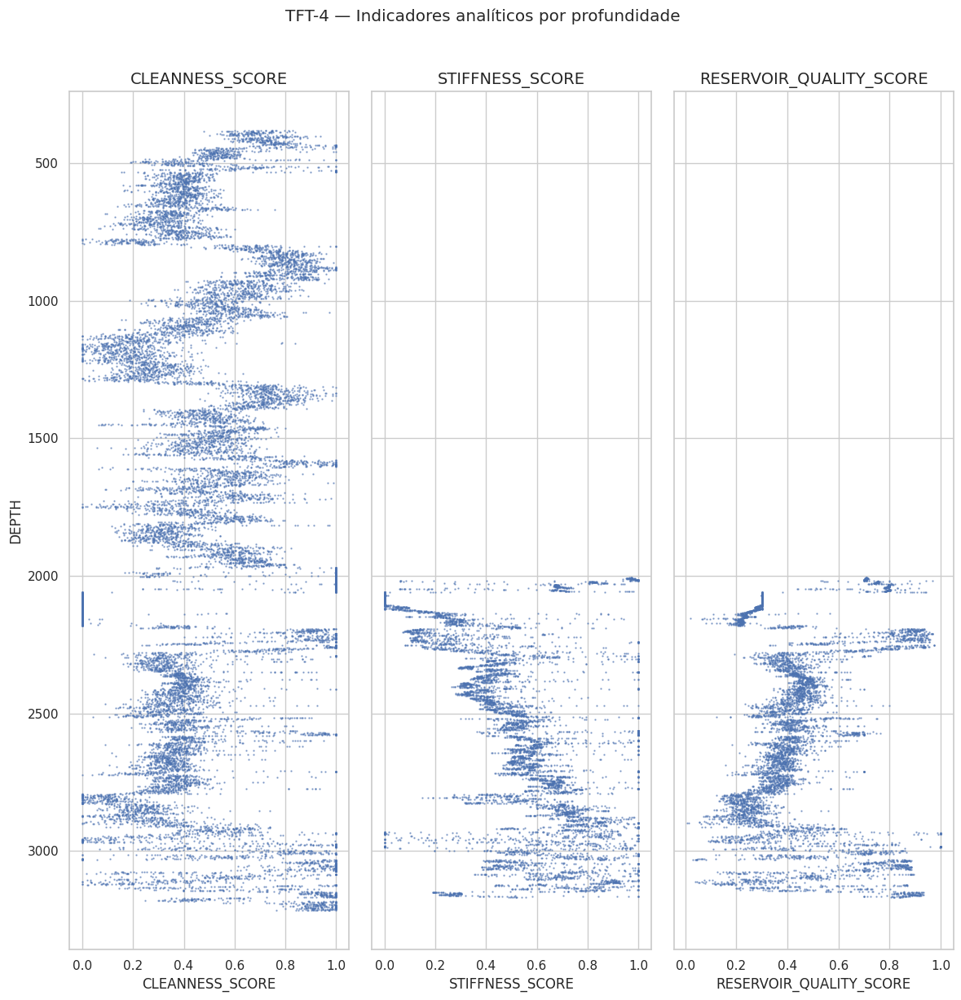

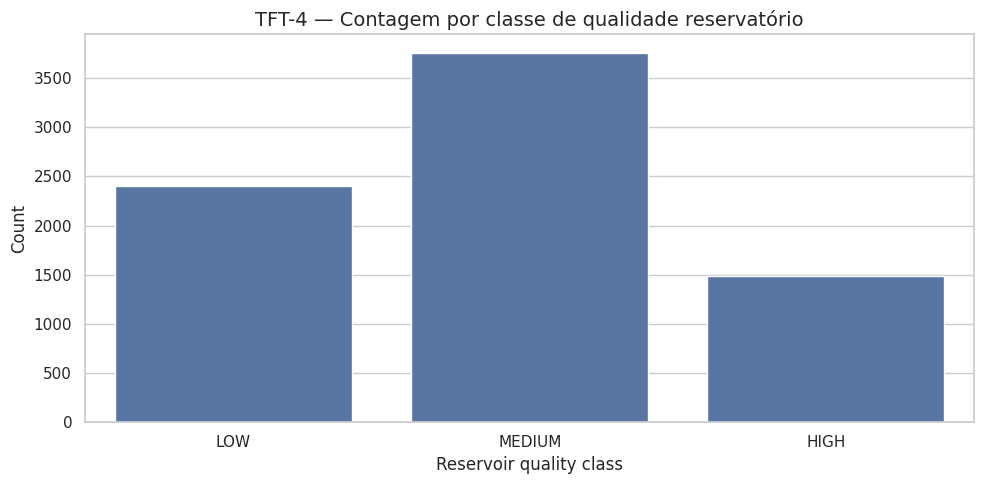

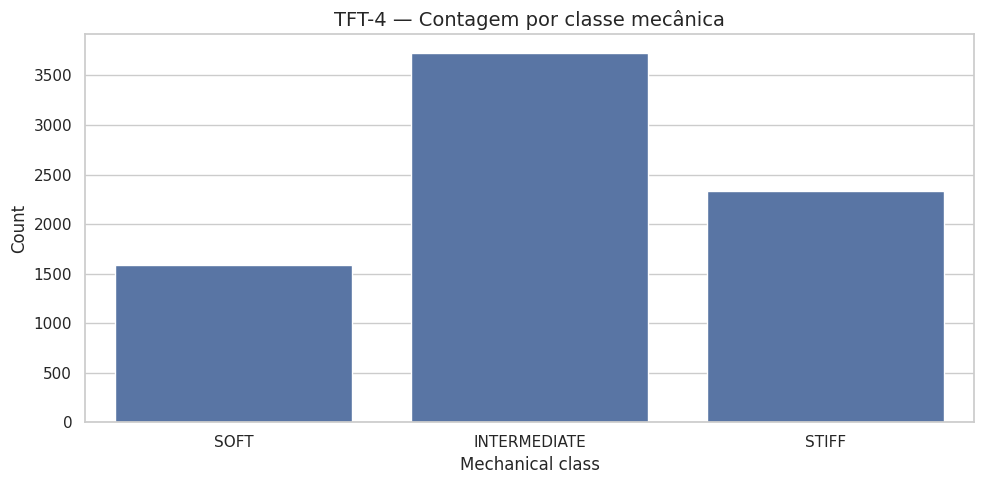

In [15]:
# ============================================================
# STEP 11.1 — VISUALIZAÇÃO DOS INDICADORES
# ============================================================

plot_depth_tracks(
    analytics_df,
    ["CLEANNESS_SCORE", "STIFFNESS_SCORE", "RESERVOIR_QUALITY_SCORE"],
    title=f"{WELL_NAME} — Indicadores analíticos por profundidade"
)

plt.figure(figsize=(10, 5))
sns.countplot(data=analytics_df, x="RESERVOIR_QUALITY_CLASS", order=["LOW", "MEDIUM", "HIGH"])
plt.title(f"{WELL_NAME} — Contagem por classe de qualidade reservatório")
plt.xlabel("Reservoir quality class")
plt.ylabel("Count")
plt.tight_layout()
plt.show()

plt.figure(figsize=(10, 5))
sns.countplot(data=analytics_df, x="MECHANICAL_CLASS", order=["SOFT", "INTERMEDIATE", "STIFF"])
plt.title(f"{WELL_NAME} — Contagem por classe mecânica")
plt.xlabel("Mechanical class")
plt.ylabel("Count")
plt.tight_layout()
plt.show()

## Interpretação mental — indicadores de qualidade e rigidez

Esses indicadores são aproximações analíticas, não diagnósticos finais.

Eles ajudam a marcar zonas candidatas para investigação mais detalhada.

# STEP 12 — Homogeneity Analysis

Homogeneidade significa baixa variação local das propriedades.

Intervalos homogêneos são bons candidatos para simulação 1D inicial.

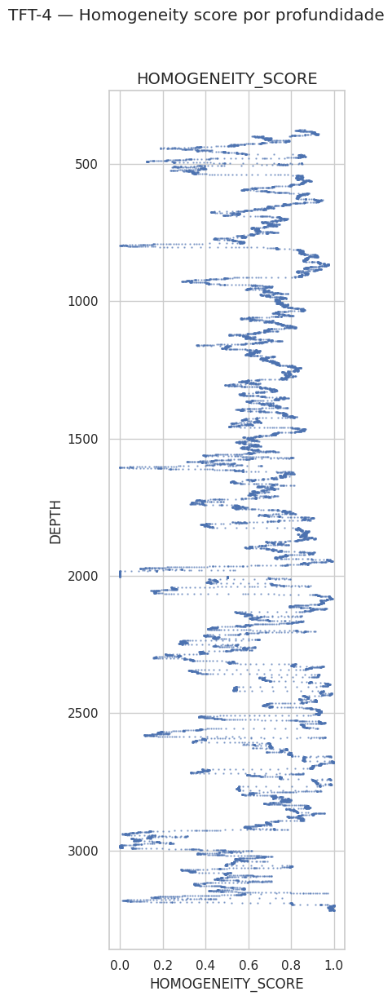

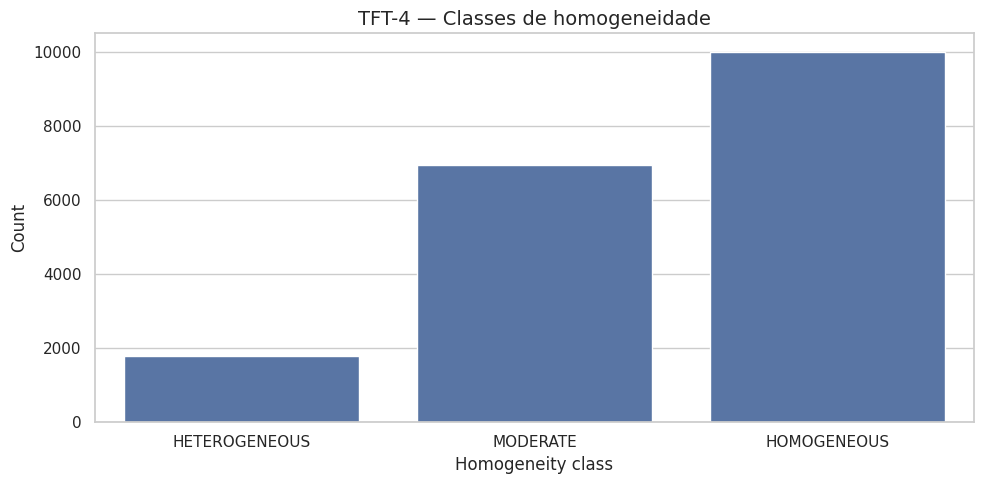

In [16]:
# ============================================================
# STEP 12 — HOMOGENEITY ANALYSIS
# ============================================================

homogeneity_components = []

for col in ["VSH_GR_LINEAR", "AI", "VP_VS_RATIO", "YOUNG_MODULUS_PA"]:
    roll_std_col = f"{col}_ROLL_STD"
    if roll_std_col in analytics_df.columns and analytics_df[roll_std_col].notna().any():
        homogeneity_components.append(1 - robust_minmax(analytics_df[roll_std_col]))

if homogeneity_components:
    analytics_df["HOMOGENEITY_SCORE"] = pd.concat(homogeneity_components, axis=1).mean(axis=1)
else:
    analytics_df["HOMOGENEITY_SCORE"] = np.nan

analytics_df["HOMOGENEITY_CLASS"] = pd.cut(
    analytics_df["HOMOGENEITY_SCORE"],
    bins=[-np.inf, 0.33, 0.66, np.inf],
    labels=["HETEROGENEOUS", "MODERATE", "HOMOGENEOUS"]
)

plot_depth_tracks(
    analytics_df,
    ["HOMOGENEITY_SCORE"],
    title=f"{WELL_NAME} — Homogeneity score por profundidade"
)

plt.figure(figsize=(10, 5))
sns.countplot(data=analytics_df, x="HOMOGENEITY_CLASS", order=["HETEROGENEOUS", "MODERATE", "HOMOGENEOUS"])
plt.title(f"{WELL_NAME} — Classes de homogeneidade")
plt.xlabel("Homogeneity class")
plt.ylabel("Count")
plt.tight_layout()
plt.show()

## Interpretação mental — homogeneidade

- `HOMOGENEOUS`: intervalo mais estável;
- `MODERATE`: comportamento intermediário;
- `HETEROGENEOUS`: intervalo instável, com alternância ou transição.

Conclusão prática:

Para FEniCS, intervalos mais homogêneos são candidatos mais seguros para começar.

# STEP 13 — Simple Physical Clustering

Criamos facies físicas exploratórias com regras simples.

Não é ML avançado.  
É uma organização inicial dos padrões.

,COUNT
PHYSICAL_FACIES_RULE,
MIXED / TRANSITIONAL,8520
SHALEY / HIGH VSH,5542
UNCLASSIFIED,2866
CLEANER / STIFFER,1003
CLEANER / SOFTER,800


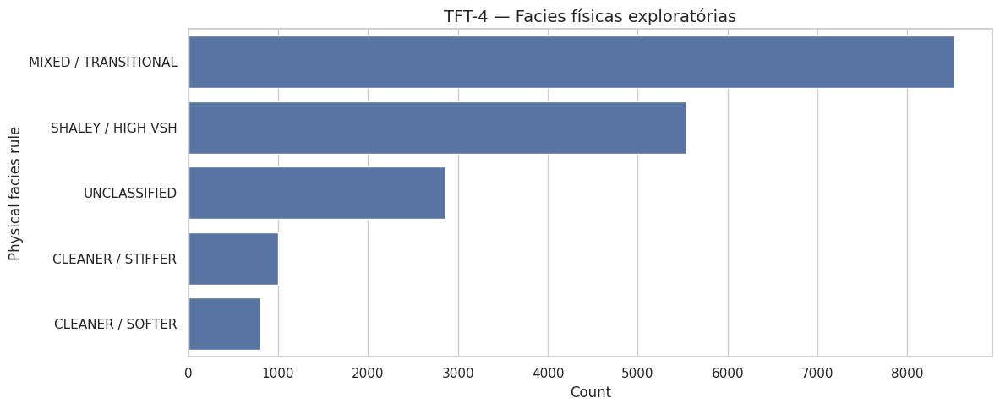

In [17]:
# ============================================================
# STEP 13 — SIMPLE PHYSICAL CLUSTERING
# ============================================================

cluster_features = [c for c in [
    "VSH_GR_LINEAR", "AI", "VP_VS_RATIO", "POISSON_RATIO", "YOUNG_MODULUS_PA"
] if c in analytics_df.columns and analytics_df[c].notna().any()]

cluster_norm = pd.DataFrame(index=analytics_df.index)

for col in cluster_features:
    cluster_norm[f"{col}_NORM"] = robust_minmax(analytics_df[col])

vsh_n = cluster_norm.get("VSH_GR_LINEAR_NORM", pd.Series(np.nan, index=analytics_df.index))
ai_n = cluster_norm.get("AI_NORM", pd.Series(np.nan, index=analytics_df.index))
young_n = cluster_norm.get("YOUNG_MODULUS_PA_NORM", pd.Series(np.nan, index=analytics_df.index))

rigidity_n = pd.concat([ai_n, young_n], axis=1).mean(axis=1)

conditions = [
    vsh_n > 0.66,
    (vsh_n <= 0.33) & (rigidity_n <= 0.50),
    (vsh_n <= 0.33) & (rigidity_n > 0.50),
    (vsh_n > 0.33) & (vsh_n <= 0.66),
]

choices = [
    "SHALEY / HIGH VSH",
    "CLEANER / SOFTER",
    "CLEANER / STIFFER",
    "MIXED / TRANSITIONAL",
]

analytics_df["PHYSICAL_FACIES_RULE"] = np.select(conditions, choices, default="UNCLASSIFIED")

display(analytics_df["PHYSICAL_FACIES_RULE"].value_counts(dropna=False).to_frame("COUNT"))

plt.figure(figsize=(12, 5))
sns.countplot(
    data=analytics_df,
    y="PHYSICAL_FACIES_RULE",
    order=analytics_df["PHYSICAL_FACIES_RULE"].value_counts().index
)
plt.title(f"{WELL_NAME} — Facies físicas exploratórias")
plt.xlabel("Count")
plt.ylabel("Physical facies rule")
plt.tight_layout()
plt.show()

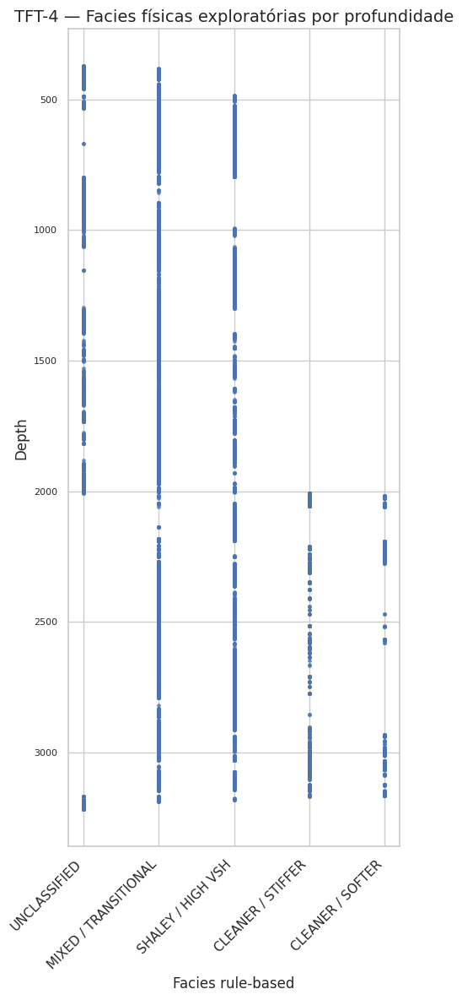

In [18]:
# ============================================================
# STEP 13.1 — FACIES POR PROFUNDIDADE
# ============================================================

facies_map = analytics_df[["DEPTH", "PHYSICAL_FACIES_RULE"]].dropna().copy()

facies_codes = {
    name: idx for idx, name in enumerate(facies_map["PHYSICAL_FACIES_RULE"].unique())
}

facies_map["FACIES_CODE"] = facies_map["PHYSICAL_FACIES_RULE"].map(facies_codes)

plt.figure(figsize=(5, 12))
plt.scatter(facies_map["FACIES_CODE"], facies_map["DEPTH"], s=6, alpha=0.7)
plt.gca().invert_yaxis()
plt.yticks(fontsize=8)
plt.xticks(list(facies_codes.values()), list(facies_codes.keys()), rotation=45, ha="right")
plt.title(f"{WELL_NAME} — Facies físicas exploratórias por profundidade")
plt.xlabel("Facies rule-based")
plt.ylabel("Depth")
plt.tight_layout()
plt.show()

## Interpretação mental — facies físicas simples

Esta classificação organiza padrões, mas não substitui interpretação geológica final.

Conclusão prática:

Essas facies ajudam a selecionar intervalos para olhar com mais cuidado.

# STEP 14 — Anomaly Investigation

Criamos um score simples de anomalia combinando flags, baixa homogeneidade e extremos robustos.

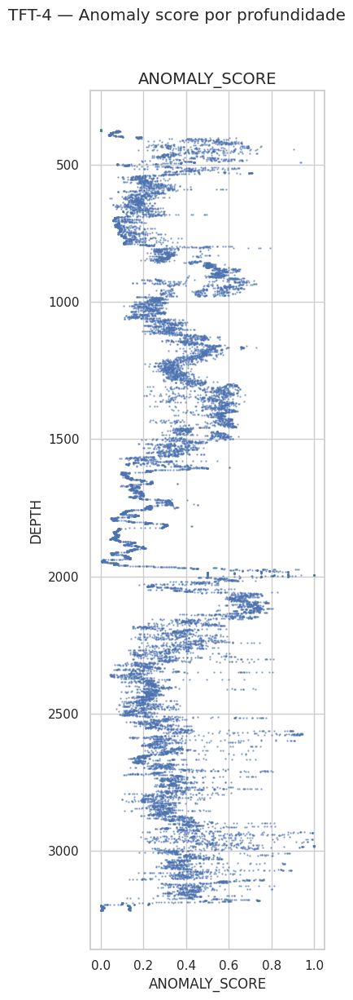

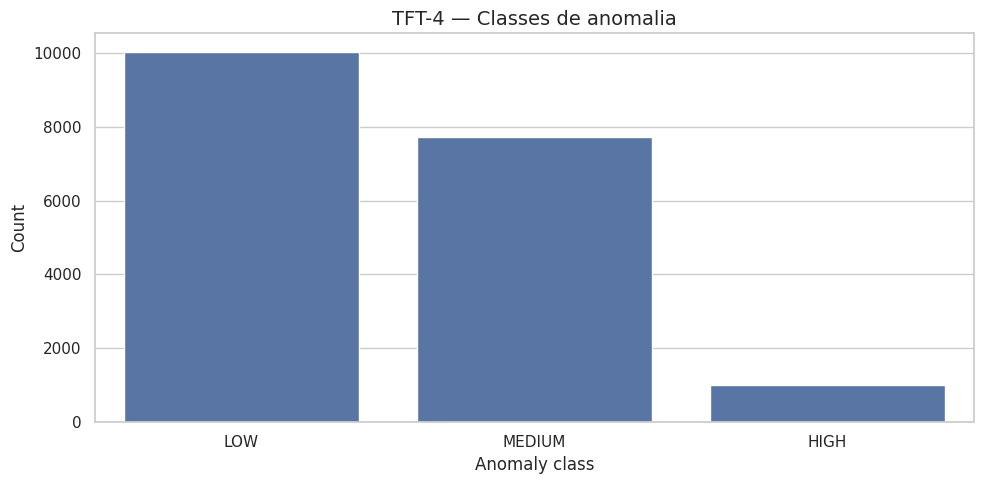

,DEPTH,ANOMALY_SCORE,ANOMALY_CLASS,TOTAL_FLAG_COUNT_ANALYTICS,HOMOGENEITY_SCORE,PHYSICAL_FACIES_RULE
334,422.776400,0.660485,HIGH,4,0.667685,UNCLASSIFIED
379,429.616400,0.662549,HIGH,4,0.511535,UNCLASSIFIED
380,429.768400,0.752581,HIGH,4,0.509521,UNCLASSIFIED
381,429.920400,0.690660,HIGH,4,0.516112,UNCLASSIFIED
382,430.072400,0.661931,HIGH,4,0.523828,UNCLASSIFIED
384,430.376400,0.672555,HIGH,4,0.536912,UNCLASSIFIED
385,430.528400,0.683419,HIGH,4,0.541966,UNCLASSIFIED
386,430.680400,0.689174,HIGH,4,0.548319,UNCLASSIFIED
387,430.832400,0.689171,HIGH,4,0.550489,UNCLASSIFIED
412,434.632400,0.746644,HIGH,5,0.506713,UNCLASSIFIED


In [19]:
# ============================================================
# STEP 14 — ANOMALY INVESTIGATION
# ============================================================

flag_cols = [c for c in analytics_df.columns if c.startswith("FLAG_")]

analytics_df["TOTAL_FLAG_COUNT_ANALYTICS"] = analytics_df[flag_cols].sum(axis=1) if flag_cols else 0

anomaly_components = []

if "TOTAL_FLAG_COUNT_ANALYTICS" in analytics_df.columns:
    anomaly_components.append(robust_minmax(analytics_df["TOTAL_FLAG_COUNT_ANALYTICS"]))

if "HOMOGENEITY_SCORE" in analytics_df.columns:
    anomaly_components.append(1 - analytics_df["HOMOGENEITY_SCORE"])

for col in ["VP_VS_RATIO", "POISSON_RATIO", "AI", "YOUNG_MODULUS_PA"]:
    if col in analytics_df.columns and analytics_df[col].notna().any():
        x = analytics_df[col]
        mad = np.median(np.abs(x.dropna() - x.dropna().median()))
        if mad and not np.isnan(mad):
            robust_z_abs = (0.6745 * (x - x.median()) / mad).abs()
            anomaly_components.append(robust_minmax(robust_z_abs))

if anomaly_components:
    analytics_df["ANOMALY_SCORE"] = pd.concat(anomaly_components, axis=1).mean(axis=1)
else:
    analytics_df["ANOMALY_SCORE"] = np.nan

analytics_df["ANOMALY_CLASS"] = pd.cut(
    analytics_df["ANOMALY_SCORE"],
    bins=[-np.inf, 0.33, 0.66, np.inf],
    labels=["LOW", "MEDIUM", "HIGH"]
)

plot_depth_tracks(
    analytics_df,
    ["ANOMALY_SCORE"],
    title=f"{WELL_NAME} — Anomaly score por profundidade"
)

plt.figure(figsize=(10, 5))
sns.countplot(data=analytics_df, x="ANOMALY_CLASS", order=["LOW", "MEDIUM", "HIGH"])
plt.title(f"{WELL_NAME} — Classes de anomalia")
plt.xlabel("Anomaly class")
plt.ylabel("Count")
plt.tight_layout()
plt.show()

display(
    analytics_df.loc[
        analytics_df["ANOMALY_CLASS"].astype(str).eq("HIGH"),
        ["DEPTH", "ANOMALY_SCORE", "ANOMALY_CLASS", "TOTAL_FLAG_COUNT_ANALYTICS",
         "HOMOGENEITY_SCORE", "PHYSICAL_FACIES_RULE"]
    ].head(100)
)

## Interpretação mental — anomalias

Anomalia não significa automaticamente erro.

Pode indicar:
- problema de dado;
- washout;
- ruído de ferramenta;
- mudança litológica;
- zona de transição;
- comportamento mecânico especial.

Conclusão prática:

O `ANOMALY_SCORE` serve para direcionar investigação.

# STEP 15 — Candidate Intervals for FEniCS

Criamos ranking de intervalos candidatos para futura simulação.

,DEPTH_INTERVAL,DEPTH_MIN,DEPTH_MAX,N_SAMPLES,CLEANNESS_SCORE_MEDIAN,STIFFNESS_SCORE_MEDIAN,RESERVOIR_QUALITY_SCORE_MEDIAN,HOMOGENEITY_SCORE_MEDIAN,ANOMALY_SCORE_MEDIAN,VSH_MEDIAN,AI_MEDIAN,VP_MEDIAN,VS_MEDIAN,YOUNG_MEDIAN,FENICS_CANDIDATE_SCORE
56,"(3150.0, 3200.0]","3,150.112400","3,199.968400",329,0.920288,0.283260,0.874254,0.440544,0.410464,0.079711,"7,344,412.023870","3,302.542052","1,828.480559","18,923,656,875.893940",0.672417
40,"(2350.0, 2400.0]","2,350.136400","2,399.992400",329,0.401893,0.407593,0.461016,0.881211,0.195639,0.598092,"8,275,087.698657","3,451.521678","1,812.361919","20,635,800,123.094654",0.667885
37,"(2200.0, 2250.0]","2,200.112400","2,249.968400",329,0.886470,0.219495,0.846709,0.440245,0.383851,0.113528,"7,086,540.043496","3,130.119303","1,695.106829","16,719,823,953.455042",0.664299
41,"(2400.0, 2450.0]","2,400.144400","2,449.848400",328,0.390122,0.371071,0.456471,0.874691,0.232197,0.609862,"8,019,053.493517","3,339.112435","1,799.184642","20,085,974,105.465508",0.655162
42,"(2450.0, 2500.0]","2,450.000400","2,499.856400",329,0.345741,0.447446,0.405915,0.891249,0.191078,0.654242,"8,408,593.563394","3,496.300082","1,887.347158","22,014,798,386.991280",0.647357
53,"(3000.0, 3050.0]","3,000.088400","3,049.944400",329,0.817910,0.622824,0.700000,0.536620,0.392504,0.182086,"9,025,910.401417","3,758.941607","2,157.679614","27,921,597,458.966942",0.642003
33,"(2000.0, 2050.0]","2,000.080400","2,049.936400",329,1.000000,0.716186,0.752943,0.450916,0.467939,0.000000,"10,231,529.614196","3,973.298105","2,093.456527","26,711,886,365.866692",0.640116
46,"(2650.0, 2700.0]","2,650.032400","2,699.888400",329,0.333095,0.547380,0.368147,0.898353,0.219121,0.666888,"8,837,321.350799","3,596.343627","1,983.840843","24,847,352,786.497162",0.631008
43,"(2500.0, 2550.0]","2,500.008400","2,549.864400",329,0.388849,0.537224,0.411196,0.854141,0.249745,0.611136,"8,847,097.216066","3,676.713118","1,991.433933","24,409,661,800.427399",0.630687
54,"(3050.0, 3100.0]","3,050.096400","3,099.952400",329,0.803154,0.649182,0.640851,0.495693,0.394102,0.196842,"9,211,849.219370","3,720.894496","2,135.241115","28,383,495,014.092182",0.607401


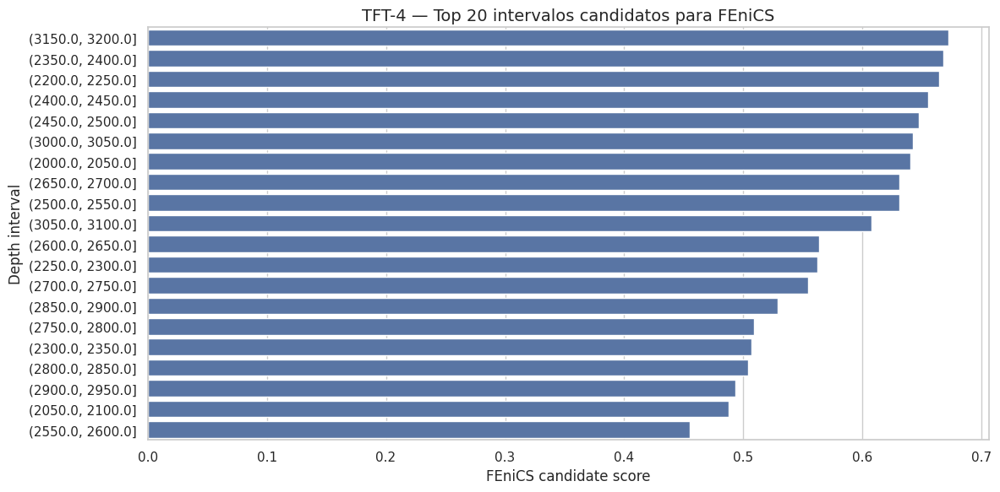

In [20]:
# ============================================================
# STEP 15 — CANDIDATE INTERVALS FOR FENICS
# ============================================================

interval_class_summary = (
    analytics_df
    .groupby("DEPTH_INTERVAL", observed=True)
    .agg(
        DEPTH_MIN=("DEPTH", "min"),
        DEPTH_MAX=("DEPTH", "max"),
        N_SAMPLES=("DEPTH", "count"),
        CLEANNESS_SCORE_MEDIAN=("CLEANNESS_SCORE", "median"),
        STIFFNESS_SCORE_MEDIAN=("STIFFNESS_SCORE", "median"),
        RESERVOIR_QUALITY_SCORE_MEDIAN=("RESERVOIR_QUALITY_SCORE", "median"),
        HOMOGENEITY_SCORE_MEDIAN=("HOMOGENEITY_SCORE", "median"),
        ANOMALY_SCORE_MEDIAN=("ANOMALY_SCORE", "median"),
        VSH_MEDIAN=("VSH_GR_LINEAR", "median"),
        AI_MEDIAN=("AI", "median"),
        VP_MEDIAN=("VP_MPS", "median"),
        VS_MEDIAN=("VS_MPS", "median"),
        YOUNG_MEDIAN=("YOUNG_MODULUS_PA", "median"),
    )
    .reset_index()
)

interval_class_summary["FENICS_CANDIDATE_SCORE"] = (
    0.35 * interval_class_summary["HOMOGENEITY_SCORE_MEDIAN"]
    + 0.30 * interval_class_summary["RESERVOIR_QUALITY_SCORE_MEDIAN"]
    + 0.20 * (1 - interval_class_summary["ANOMALY_SCORE_MEDIAN"])
    + 0.15 * interval_class_summary["CLEANNESS_SCORE_MEDIAN"]
)

candidate_intervals = interval_class_summary.sort_values("FENICS_CANDIDATE_SCORE", ascending=False)

display(candidate_intervals.head(20))
candidate_intervals.to_csv(REPORT_DIR / f"{WELL_NAME}_fenics_candidate_intervals.csv", index=False)

plt.figure(figsize=(12, 6))
top20 = candidate_intervals.head(20).copy()
sns.barplot(
    data=top20,
    x="FENICS_CANDIDATE_SCORE",
    y=top20["DEPTH_INTERVAL"].astype(str),
    orient="h"
)
plt.title(f"{WELL_NAME} — Top 20 intervalos candidatos para FEniCS")
plt.xlabel("FEniCS candidate score")
plt.ylabel("Depth interval")
plt.tight_layout()
plt.show()

## Interpretação mental — candidatos para FEniCS

Bons candidatos tendem a ter:

- boa homogeneidade;
- propriedades elásticas disponíveis;
- baixa anomalia;
- qualidade interpretativa razoável;
- menor complexidade inicial.

Conclusão prática:

O FEniCS não deve começar no intervalo mais caótico.

# STEP 16 — Analytics Summary and Export

Salvamos a camada analytics em Parquet.

In [21]:
# ============================================================
# STEP 16 — EXPORT ANALYTICS PARQUET
# ============================================================

safe_well_name = WELL_NAME.replace("/", "_").replace(" ", "_")

analytics_path = DATA_ANALYTICS_DIR / f"{safe_well_name}_single_well_analytics.parquet"

export_df = make_unique_columns(analytics_df).copy()

for col in export_df.select_dtypes(include=["category"]).columns:
    export_df[col] = export_df[col].astype("string")

if "WELL" in export_df.columns:
    export_df["WELL"] = export_df["WELL"].astype("string")

bool_cols = [c for c in export_df.columns if c.startswith("FLAG_") or export_df[c].dtype == bool]
for col in bool_cols:
    export_df[col] = export_df[col].fillna(False).astype(bool)

export_df.to_parquet(analytics_path, index=False)

column_dictionary_df = pd.DataFrame({
    "COLUMN": export_df.columns,
    "DTYPE": [str(export_df[c].dtype) for c in export_df.columns],
    "NON_NULL_COUNT": [export_df[c].notna().sum() for c in export_df.columns],
    "NULL_COUNT": [export_df[c].isna().sum() for c in export_df.columns],
    "FILL_RATE": [export_df[c].notna().mean() for c in export_df.columns],
})

column_dictionary_path = REPORT_DIR / f"{safe_well_name}_analytics_column_dictionary.csv"
column_dictionary_df.to_csv(column_dictionary_path, index=False)

analytics_summary_df = pd.DataFrame([{
    "WELL": WELL_NAME,
    "SOURCE_ENRICHED_PARQUET": str(selected_enriched_path),
    "ANALYTICS_ROWS": len(export_df),
    "ANALYTICS_COLUMNS": export_df.shape[1],
    "DEPTH_MIN": export_df["DEPTH"].min(),
    "DEPTH_MAX": export_df["DEPTH"].max(),
    "HAS_RESERVOIR_QUALITY_SCORE": "RESERVOIR_QUALITY_SCORE" in export_df.columns,
    "HAS_HOMOGENEITY_SCORE": "HOMOGENEITY_SCORE" in export_df.columns,
    "HAS_ANOMALY_SCORE": "ANOMALY_SCORE" in export_df.columns,
    "HAS_PHYSICAL_FACIES_RULE": "PHYSICAL_FACIES_RULE" in export_df.columns,
    "ANALYTICS_PARQUET": str(analytics_path),
}])

summary_path = REPORT_DIR / f"{safe_well_name}_analytics_summary.csv"
analytics_summary_df.to_csv(summary_path, index=False)

print("ANALYTICS PARQUET EXPORTADO COM SUCESSO!")
print(f"Arquivo: {analytics_path}")
print(f"Dicionário: {column_dictionary_path}")
print(f"Resumo: {summary_path}")

display(analytics_summary_df)
display(column_dictionary_df)

ANALYTICS PARQUET EXPORTADO COM SUCESSO!
Arquivo: ../data/analytics/parquet/single_well_analytics/TFT-4_single_well_analytics.parquet
Dicionário: ../reports/single_well_analytics/TFT-4_analytics_column_dictionary.csv
Resumo: ../reports/single_well_analytics/TFT-4_analytics_summary.csv


,WELL,SOURCE_ENRICHED_PARQUET,ANALYTICS_ROWS,ANALYTICS_COLUMNS,DEPTH_MIN,DEPTH_MAX,HAS_RESERVOIR_QUALITY_SCORE,HAS_HOMOGENEITY_SCORE,HAS_ANOMALY_SCORE,HAS_PHYSICAL_FACIES_RULE,ANALYTICS_PARQUET
0,TFT-4,../data/enriched/parquet/single_well_features/...,18731,143,372.008400,"3,218.968400",True,True,True,True,../data/analytics/parquet/single_well_analytic...


,COLUMN,DTYPE,NON_NULL_COUNT,NULL_COUNT,FILL_RATE
0,WELL,string,18731,0,1.000000
1,DEPTH,float64,18731,0,1.000000
2,GR,float64,18666,65,0.996530
3,RHOB,float64,7800,10931,0.416422
4,DTC,float64,18199,532,0.971598
5,DTS,float64,15252,3479,0.814265
6,NPOR,float64,7835,10896,0.418291
7,RDEP,float64,18567,164,0.991244
8,RMED,float64,18524,207,0.988949
9,CALI,float64,7842,10889,0.418664


# Encerramento do Notebook 03 — V2

Agora você tem a camada:

```text
data/analytics/parquet/single_well_analytics/
```

Esta versão corrige o problema de crossplots causado por colunas duplicadas.

Próximo notebook futuro:

```text
04_single_well_fenics_simulation.ipynb
```